In [168]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import mplhep as hep
from matplotlib.patches import Rectangle
from pathlib import Path
from typing import List, Union

from scipy.linalg import solve_triangular, qr
import json
import re
import os
import uproot
import importlib.util
plt.style.use(hep.style.CMS)

In [169]:
label_map = {
    "pth_bin0": "r_PTH_0p0_5p0",
    "pth_bin1": "r_PTH_5p0_10p0",
    "pth_bin2": "r_PTH_10p0_15p0",
    "pth_bin3": "r_PTH_15p0_20p0",
    "pth_bin4": "r_PTH_20p0_25p0",
    "pth_bin5": "r_PTH_25p0_30p0",
    "pth_bin6": "r_PTH_30p0_35p0",
    "pth_bin7": "r_PTH_35p0_45p0",
    "pth_bin8": "r_PTH_45p0_60p0",
    "pth_bin9": "r_PTH_60p0_80p0",
    "pth_bin10": "r_PTH_80p0_100p0",
    "pth_bin11": "r_PTH_100p0_120p0",
    "pth_bin12": "r_PTH_120p0_140p0",
    "pth_bin13": "r_PTH_140p0_170p0",
    "pth_bin14": "r_PTH_170p0_200p0",
    "pth_bin15": "r_PTH_200p0_250p0",
    "pth_bin16": "r_PTH_250p0_350p0",
    "pth_bin17": "r_PTH_350p0_450p0",
    "pth_bin18": "r_PTH_450p0_10000p0",
    "nj_bin0": "r_NJ_0p0_1p0",
    "nj_bin1": "r_NJ_1p0_2p0",
    "nj_bin2": "r_NJ_2p0_3p0",
    "nj_bin3": "r_NJ_3p0_4p0",
    "nj_bin4": "r_NJ_4p0_100p0",
    "ptj0_bin0": "r_PTJ0_m10000p0_30p0",
    "ptj0_bin1": "r_PTJ0_30p0_40p0",
    "ptj0_bin2": "r_PTJ0_40p0_55p0",
    "ptj0_bin3": "r_PTJ0_55p0_75p0",
    "ptj0_bin4": "r_PTJ0_75p0_95p0",
    "ptj0_bin5": "r_PTJ0_95p0_120p0",
    "ptj0_bin6": "r_PTJ0_120p0_150p0",
    "ptj0_bin7": "r_PTJ0_150p0_200p0",
    "ptj0_bin8": "r_PTJ0_200p0_10000p0",
    "rapidity_bin0": "r_YH_0p0_0p15",
    "rapidity_bin1": "r_YH_0p15_0p3",
    "rapidity_bin2": "r_YH_0p3_0p45",
    "rapidity_bin3": "r_YH_0p45_0p6",
    "rapidity_bin4": "r_YH_0p6_0p75",
    "rapidity_bin5": "r_YH_0p75_0p9",
    "rapidity_bin6": "r_YH_0p9_1p2",
    "rapidity_bin7": "r_YH_1p2_1p6",
    "rapidity_bin8": "r_YH_1p6_2p0",
    "rapidity_bin9": "r_YH_2p0_2p5",
    "dphij0j1_bin0": "r_DPhiJ0J1_m3p1416_3p1416_underflow",
    "dphij0j1_bin1": "r_DPhiJ0J1_m3p1416_m1p5708",
    "dphij0j1_bin2": "r_DPhiJ0J1_m1p5708_0p0",
    "dphij0j1_bin3": "r_DPhiJ0J1_0p0_1p5708",
    "dphij0j1_bin4": "r_DPhiJ0J1_1p5708_3p1416"
}


label_map_theory = {
    "PTH_bin0": "r_PTH_0p0_5p0",
    "PTH_bin1": "r_PTH_5p0_10p0",
    "PTH_bin2": "r_PTH_10p0_15p0",
    "PTH_bin3": "r_PTH_15p0_20p0",
    "PTH_bin4": "r_PTH_20p0_25p0",
    "PTH_bin5": "r_PTH_25p0_30p0",
    "PTH_bin6": "r_PTH_30p0_35p0",
    "PTH_bin7": "r_PTH_35p0_45p0",
    "PTH_bin8": "r_PTH_45p0_60p0",
    "PTH_bin9": "r_PTH_60p0_80p0",
    "PTH_bin10": "r_PTH_80p0_100p0",
    "PTH_bin11": "r_PTH_100p0_120p0",
    "PTH_bin12": "r_PTH_120p0_140p0",
    "PTH_bin13": "r_PTH_140p0_170p0",
    "PTH_bin14": "r_PTH_170p0_200p0",
    "PTH_bin15": "r_PTH_200p0_250p0",
    "PTH_bin16": "r_PTH_250p0_350p0",
    "PTH_bin17": "r_PTH_350p0_450p0",
    "PTH_bin18": "r_PTH_450p0_10000p0",
    "NJ_bin0": "r_NJ_0p0_1p0",
    "NJ_bin1": "r_NJ_1p0_2p0",
    "NJ_bin2": "r_NJ_2p0_3p0",
    "NJ_bin3": "r_NJ_3p0_4p0",
    "NJ_bin4": "r_NJ_4p0_100p0",
    "PTJ0_bin0": "r_PTJ0_m10000p0_30p0",
    "PTJ0_bin1": "r_PTJ0_30p0_40p0",
    "PTJ0_bin2": "r_PTJ0_40p0_55p0",
    "PTJ0_bin3": "r_PTJ0_55p0_75p0",
    "PTJ0_bin4": "r_PTJ0_75p0_95p0",
    "PTJ0_bin5": "r_PTJ0_95p0_120p0",
    "PTJ0_bin6": "r_PTJ0_120p0_150p0",
    "PTJ0_bin7": "r_PTJ0_150p0_200p0",
    "PTJ0_bin8": "r_PTJ0_200p0_10000p0",
    "YH_bin0": "r_YH_0p0_0p15",
    "YH_bin1": "r_YH_0p15_0p3",
    "YH_bin2": "r_YH_0p3_0p45",
    "YH_bin3": "r_YH_0p45_0p6",
    "YH_bin4": "r_YH_0p6_0p75",
    "YH_bin5": "r_YH_0p75_0p9",
    "YH_bin6": "r_YH_0p9_1p2",
    "YH_bin7": "r_YH_1p2_1p6",
    "YH_bin8": "r_YH_1p6_2p0",
    "YH_bin9": "r_YH_2p0_2p5",
    "DPhiJ0J1_bin0": "r_DPhiJ0J1_m3p1416_3p1416_underflow",
    "DPhiJ0J1_bin1": "r_DPhiJ0J1_m3p1416_m1p5708",
    "DPhiJ0J1_bin2": "r_DPhiJ0J1_m1p5708_0p0",
    "DPhiJ0J1_bin3": "r_DPhiJ0J1_0p0_1p5708",
    "DPhiJ0J1_bin4": "r_DPhiJ0J1_1p5708_3p1416"
}

# Importing translation dictionary
translationFilePath = "/work/niharrin/devel/useful_scripts/EFT_scripts/parametrization/translation.json"
with open(translationFilePath) as translationFile:
    translation = json.load(translationFile)

In [170]:
def read_bootstrap_file(path: Union[str, Path], prefix: str) -> pd.DataFrame:
    """
    Read one bootstrap text file.
    - Drops the first 4 header lines.
    - Drops first data column (replica index).
    - Returns only bin columns, prefixed to keep names unique across files.
    """
    path = Path(path)

    # Header in these files starts with '#'; this also skips the first 4 lines
    df = pd.read_csv(path, sep=r"\s+", comment="#", header=None)

    # Drop first row (text labels) and first column (replica/bin label)
    df = df.iloc[:, 1:].copy()
    df.columns = [f"{prefix}_bin{i}" for i in range(df.shape[1])]

    return df


def build_df(
    pth_path: Union[str, Path],
    nj_path: Union[str, Path],
    rapidity_path: Union[str, Path],
    ptj0_path: Union[str, Path],
    dphij0j1_path: Union[str, Path],
) -> pd.DataFrame:
    """Read all three files and return one dataframe per variable"""
    pth = read_bootstrap_file(pth_path, "pth")
    nj = read_bootstrap_file(nj_path, "nj")
    rapidity = read_bootstrap_file(rapidity_path, "rapidity")
    ptj0 = read_bootstrap_file(ptj0_path, "ptj0")
    dphij0j1 = read_bootstrap_file(dphij0j1_path, "dphij0j1")

    # Check if all variables have the same number of replicas
    if not (len(pth) == len(nj) == len(ptj0) == len(rapidity) == len(dphij0j1)):
    # if not (len(pth) == len(nj)):
        raise ValueError("Replica counts do not match across files.")

    return pd.concat([pth, nj, rapidity, ptj0, dphij0j1], axis=1)
    # return pd.concat([pth, nj], axis=1)

## Helper function to invert a matrix and compute correlations from covariances
def invert_matrix(matrix: pd.DataFrame) -> pd.DataFrame:
    return pd.DataFrame(
        np.linalg.inv(matrix.to_numpy()),
        index=matrix.index,
        columns=matrix.columns,
    )

## Helper function to compute correlations from covariances
def compute_corr(cov: pd.DataFrame) -> pd.DataFrame:
    sigma = np.sqrt(np.diag(cov.to_numpy()))
    denom = np.outer(sigma, sigma)
    corr = np.divide(
        cov.to_numpy(),
        denom,
        out=np.zeros_like(cov.to_numpy()), 
        where=denom != 0,
    )
    return pd.DataFrame(corr, index=cov.index, columns=cov.columns)

# Plot correlation matrix at gen-level
def plot_corr(_corr_gen, title="Correlation Matrix (Generator Level)", save_path=None, label_map=None, cms_label="Supplementary", plot_label="Correlation", apply_translation=True, n_b1=None, n_b2=None, n_b3=None, n_b4=None):
    corr_gen_mask = np.triu(np.ones_like(_corr_gen, dtype=bool), k=1)
    fig_corr_gen, ax_corr_gen = plt.subplots(figsize=(28, 18), constrained_layout=True)
    hep.set_style("CMS")
    hep.cms.label(cms_label, loc=0, data=True, lumi=172.13, com=13.6)
    sns.heatmap(
        _corr_gen,
        ax=ax_corr_gen,
        cmap=palette,
        mask=corr_gen_mask,
        vmin=-1,
        vmax=1,
        annot=True,
        fmt=".2f",
        center=0,
        square=True,
        annot_kws={"size": 10, "weight": "bold"},
        cbar_kws={"label": plot_label},
    )
    ax_corr_gen.set_title(title)
    ax_corr_gen.set_xlabel("Bins")
    ax_corr_gen.set_ylabel("Bins")
    
    # ---- LABEL TRANSLATION LOGIC ----
    if label_map is not None:
        # assume index == columns order
        original_labels = list(_corr_gen.index)

        translated_labels = [
            label_map.get(lbl, lbl) for lbl in original_labels
        ]

        if apply_translation:
            translated_labels = [translation[current_label] for current_label in translated_labels]
        
        n = len(translated_labels)
        ax_corr_gen.set_xticks(np.arange(n) + 0.5)
        ax_corr_gen.set_yticks(np.arange(n) + 0.5)
        
        ax_corr_gen.set_xticklabels(translated_labels, rotation=90, fontsize=12)
        ax_corr_gen.set_yticklabels(translated_labels, rotation=0, fontsize=12)
        # IMPORTANT: re-apply tick styling AFTER setting labels
        ax_corr_gen.tick_params(
            axis="x",
            which="both",
            length=0,   # <- removes tick marks
            bottom=False,
            top=False
        )
        ax_corr_gen.tick_params(
            axis="y",
            which="both",
            length=0,   # <- removes tick marks
            left=False,
            right=False
        )

    else:
        ax_corr_gen.tick_params(
            axis="x", which="both", labelrotation=90, bottom=False, top=False, length=0, labelsize=12
        )
        ax_corr_gen.tick_params(
            axis="y", which="both", labelrotation=0, left=False, right=False, length=0, labelsize=12
        )

    ax_corr_gen.minorticks_off()
    n_bins = _corr_gen.shape[0]
    if n_b1 == None:
        n_b1 = b1
    if n_b2 == None:
        n_b2 = b2
    if n_b3 == None:
        n_b3 = b3
    if n_b4 == None:
        n_b4 =b4
    for b in (n_b1, n_b2, n_b3, n_b4):
        # Draw only on the visible lower triangle
        ax_corr_gen.plot([0, b], [b, b], color="black", lw=1)
        ax_corr_gen.plot([b, b], [b, n_bins], color="black", lw=1)
    ax_corr_gen.add_patch(Rectangle((0, 0), n_bins, n_bins, fill=False, edgecolor="black", lw=2))
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    else:
        plt.show()

# Plot covariance matrix at gen-level
def plot_cov(_corr_gen, title="Covariance Matrix (Generator Level)", save_path=None, label_map=None, cms_label="Supplementary", plot_label=r"Covariance [fb$^{2}$]", apply_translation=True, n_b1=None, n_b2=None, n_b3=None, n_b4=None):
    corr_gen_mask = np.triu(np.ones_like(_corr_gen, dtype=bool), k=1)
    fig_corr_gen, ax_corr_gen = plt.subplots(figsize=(28, 18), constrained_layout=True)
    hep.set_style("CMS")
    hep.cms.label(cms_label, loc=0, data=True, lumi=172.13, com=13.6)
    sns.heatmap(
        _corr_gen,
        ax=ax_corr_gen,
        cmap=palette,
        mask=corr_gen_mask,
        vmin = _corr_gen.to_numpy().min(),
        vmax = _corr_gen.to_numpy().max(),
        annot=True,
        fmt=".2f",
        center=0,
        square=True,
        annot_kws={"size": 10, "weight": "bold"},
        cbar_kws={"label": plot_label},
        # cbar_kws={"label": "Theoretical Covariance"},
    )
    ax_corr_gen.set_title(title)
    ax_corr_gen.set_xlabel("Bins")
    ax_corr_gen.set_ylabel("Bins")
    
    # ---- LABEL TRANSLATION LOGIC ----
    if label_map is not None:
        # assume index == columns order
        original_labels = list(_corr_gen.index)

        translated_labels = [
            label_map.get(lbl, lbl) for lbl in original_labels
        ]
        
        if apply_translation:
            translated_labels = [translation[current_label] for current_label in translated_labels]

        n = len(translated_labels)
        ax_corr_gen.set_xticks(np.arange(n) + 0.5)
        ax_corr_gen.set_yticks(np.arange(n) + 0.5)

        ax_corr_gen.set_xticklabels(translated_labels, rotation=90, fontsize=12)
        ax_corr_gen.set_yticklabels(translated_labels, rotation=0, fontsize=12)
        # IMPORTANT: re-apply tick styling AFTER setting labels
        ax_corr_gen.tick_params(
            axis="x",
            which="both",
            length=0,   # <- removes tick marks
            bottom=False,
            top=False
        )
        ax_corr_gen.tick_params(
            axis="y",
            which="both",
            length=0,   # <- removes tick marks
            left=False,
            right=False
        )

    else:
        ax_corr_gen.tick_params(
            axis="x", which="both", labelrotation=90, bottom=False, top=False, length=0, labelsize=12
        )
        ax_corr_gen.tick_params(
            axis="y", which="both", labelrotation=0, left=False, right=False, length=0, labelsize=12
        )

    ax_corr_gen.minorticks_off()
    n_bins = _corr_gen.shape[0]
    if n_b1 == None:
        n_b1 = b1
    if n_b2 == None:
        n_b2 = b2
    if n_b3 == None:
        n_b3 = b3
    if n_b4 == None:
        n_b4 = b4
    for b in (n_b1, n_b2, n_b3, n_b4):
        # Draw only on the visible lower triangle
        ax_corr_gen.plot([0, b], [b, b], color="black", lw=1)
        ax_corr_gen.plot([b, b], [b, n_bins], color="black", lw=1)
    ax_corr_gen.add_patch(Rectangle((0, 0), n_bins, n_bins, fill=False, edgecolor="black", lw=2))
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    else:
        plt.show()

In [175]:
VARIABLE_PREFIXES = ("pth_", "nj_", "rapidity_", "ptj0_", "DPhiJ0J1_")
# VARIABLE_PREFIXES = ("PTH_", "NJ_", "PTJ0_")
# VARIABLE_PREFIXES = ("pth_", "nj_")

# YEARS = ["2022", "2023", "2024"]
YEARS = ["2022"]

CAT = ["cat0", "cat1", "cat2"]


def zero_intra_variable_off_diagonal_block(matrix: pd.DataFrame) -> pd.DataFrame:
    out = matrix.copy()
    cols = list(out.columns)
    for pref in VARIABLE_PREFIXES:
        group = [c for c in cols if c.startswith(pref)]
        for ci in group:
            for cj in group:
                if ci != cj:
                    out.loc[ci, cj] = 0.0
    return out

def zero_below_threshold_keep_diag(matrix: pd.DataFrame, threshold: float, use_abs: bool = True) -> pd.DataFrame:
    out = matrix.copy()
    vals = out.abs() if use_abs else out
    mask = vals < threshold
    np.fill_diagonal(mask.values, False)
    out[mask] = 0.0
    return out

def corr_from_cov(cov_mat: pd.DataFrame) -> pd.DataFrame:
    v = np.diag(cov_mat.to_numpy())
    sigma = np.sqrt(np.clip(v, 0.0, None))
    with np.errstate(divide="ignore", invalid="ignore"):
        outer = np.outer(1.0 / sigma, 1.0 / sigma)
        arr = outer * cov_mat.to_numpy()
    arr = np.nan_to_num(arr, nan=0.0, posinf=0.0, neginf=0.0)
    np.fill_diagonal(arr, 1.0)
    return pd.DataFrame(arr, index=cov_mat.index, columns=cov_mat.columns)

####################################################################################################

df_dict = {}


# We can combine the sidebands across the YEARS (also done in FinalFits)
df_combined = pd.DataFrame()

for year in YEARS:
    df = build_df(
        f"bootstrap_noCat/bootstrap_sideband_counts_pth_{year}.txt",
        f"bootstrap_noCat/bootstrap_sideband_counts_nj_{year}.txt",
        f"bootstrap_noCat/bootstrap_sideband_counts_rapidity_{year}.txt",
        f"bootstrap_noCat/bootstrap_sideband_counts_ptj0_{year}.txt",
        f"bootstrap_noCat/bootstrap_sideband_counts_DPhiJ0J1_{year}.txt",
    )
            
    df_combined = df_combined.add(df, fill_value=0)

# if cat == "cat0":
#     print(df_combined)

df_combined = df_combined.reindex(columns=df.columns)    

c = df_combined.cov()

## To force setting all off-diagonal entries within each observable to zero uncomment below
## This can be useful when running on few replicas where fluctuations can induce non-zero off-diagonal entries
c = zero_intra_variable_off_diagonal_block(c)
## This can be used to set all elements below a threshold to zero
# c = zero_below_threshold_keep_diag(c, 200)
## Force the symmetry of the covariance matrix
c = 0.5 * (c + c.T)

# label_to_drop = c.index[12]
# c = c.drop(index=label_to_drop, columns=label_to_drop)
cov = c
corr = df_combined.corr()#.drop(index=label_to_drop, columns=label_to_drop)

In [190]:
hep.style.use("CMS")
palette = sns.diverging_palette(240, 10, n=20, as_cmap=True)


# Boundaries between variable blocks (pth | nj | ptj0); same layout for all categories
_ref = cov  # same bin layout for all categories

b1 = len([c for c in _ref.columns if c.startswith("pth_")])
b2 = b1 + len([c for c in _ref.columns if c.startswith("nj_")])
b3 = b2 + len([c for c in _ref.columns if c.startswith("ptj0_")]) + 1
b4 = b3 + len([c for c in _ref.columns if c.startswith("rapidity_")]) - 1

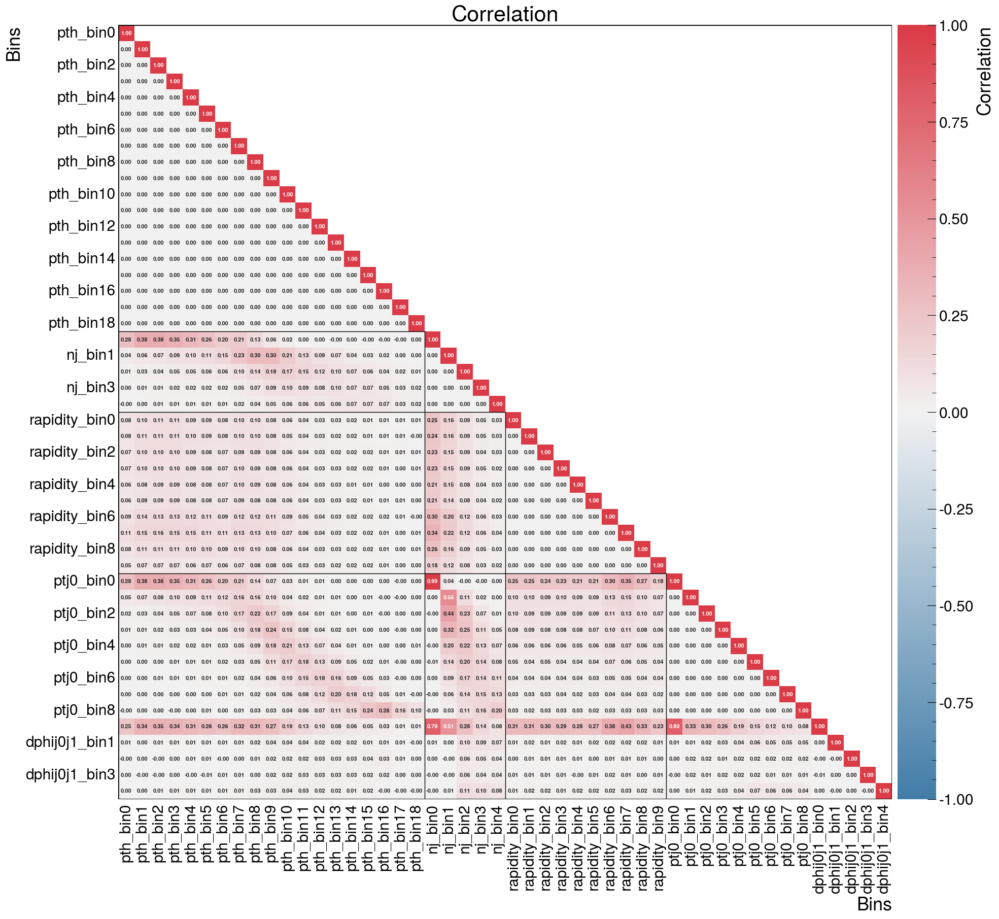

In [174]:
fig_corr, ax = plt.subplots(
    figsize=(24, 18),
    constrained_layout=True
)

cmat = corr_from_cov(cov)
corr_mask = np.triu(np.ones_like(cmat, dtype=bool), k=1)

sns.heatmap(
    cmat,
    ax=ax,
    cmap=palette,
    mask=corr_mask,
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"label": "Correlation", "pad": 0.005},
)

ax.set_title(f"Correlation")
ax.set_xlabel("Bins")
ax.set_ylabel("Bins")

_decorate_matrix_ax(ax, cmat.shape[0])

# plt.show()
plt.savefig(f"correlation_sidebands_incl.pdf", dpi=300)

In [177]:
## Loading the response matrix
def read_response_block(path: str):
    """Read response_matrix_*.txt and return numeric square block."""
    raw = pd.read_csv(path, sep=r"\s+", header=None)
    block = raw.iloc[1:, 1:].astype(float).to_numpy()
    # if block.shape[0] != block.shape[1]:
    #     raise ValueError(f"Response block is not square for {path}: {block.shape}")
    return block


def response_paths_for_category(cat: str) -> dict:
    """Lumi-weighted response .txt paths per observable for one reco category."""
    suffix = "combined" #combined
    return {
        "ptj0": f"response_matrix_{suffix}/response_matrix_PTJ0_{cat}.txt",
        "nj": f"response_matrix_{suffix}/response_matrix_NJ_{cat}.txt",
        "rapidity": f"response_matrix_{suffix}/response_matrix_YH_{cat}.txt",
        "pth": f"response_matrix_{suffix}/response_matrix_PTH_{cat}.txt",
        "dphij0j1": f"response_matrix_{suffix}/response_matrix_DPhiJ0J1_{cat}.txt",
    }


def build_block_diagonal_resp(cov_mat: pd.DataFrame, cat: str) -> pd.DataFrame:
    resp_files = response_paths_for_category(cat)
    cols = list(cov_mat.columns)
    prefix_order = []
    for col in cols:
        pref = col.split("_", 1)[0]
        if pref not in prefix_order:
            prefix_order.append(pref)
    
    resp = pd.DataFrame(0.0, index=cov_mat.index, columns=cov_mat.columns)
    start = 0
    for pref in prefix_order:
        block_cols = [c for c in cols if c.startswith(f"{pref}_")]
        n = len(block_cols)
        if pref not in resp_files:
            raise ValueError(f"No response matrix file configured for prefix '{pref}'")

        block = read_response_block(resp_files[pref])
        # if pref == "ptj0":
        #     block = block[1:, 1:] # Drop first row and first column to remove the underflow bin for pTj0
        if block.shape != (n, n):
            raise ValueError(
                f"Shape mismatch for {resp_files[pref]}: got {block.shape}, expected {(n, n)} in year {year}"
            )

        stop = start + n
        resp.iloc[start:stop, start:stop] = block
        start = stop
    return resp

resp = {cat: build_block_diagonal_resp(cov, cat) for cat in CAT}

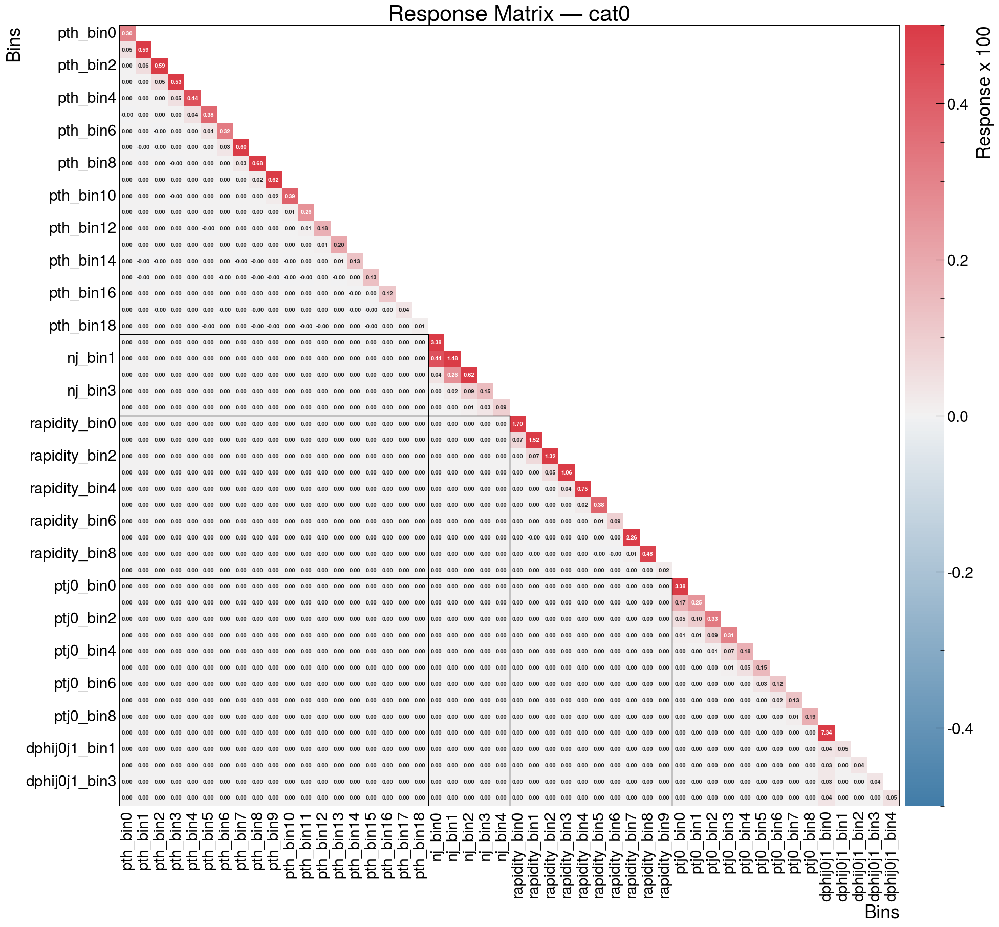

In [178]:
fig_corr, ax = plt.subplots(
    figsize=(24, 18),
    constrained_layout=True
)

cat = "cat0"


cmat = resp[cat]*100
corr_mask = np.triu(np.ones_like(cmat, dtype=bool), k=1)

sns.heatmap(
    cmat,
    ax=ax,
    cmap=palette,
    mask=corr_mask,
    vmin=-0.5,
    vmax=0.5,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"label": "Response x 100", "pad": 0.005},
)

ax.set_title(f"Response Matrix — {cat}")
ax.set_xlabel("Bins")
ax.set_ylabel("Bins")

_decorate_matrix_ax(ax, cmat.shape[0])

# plt.show()
plt.savefig(f"response_{cat}.pdf", dpi=300)

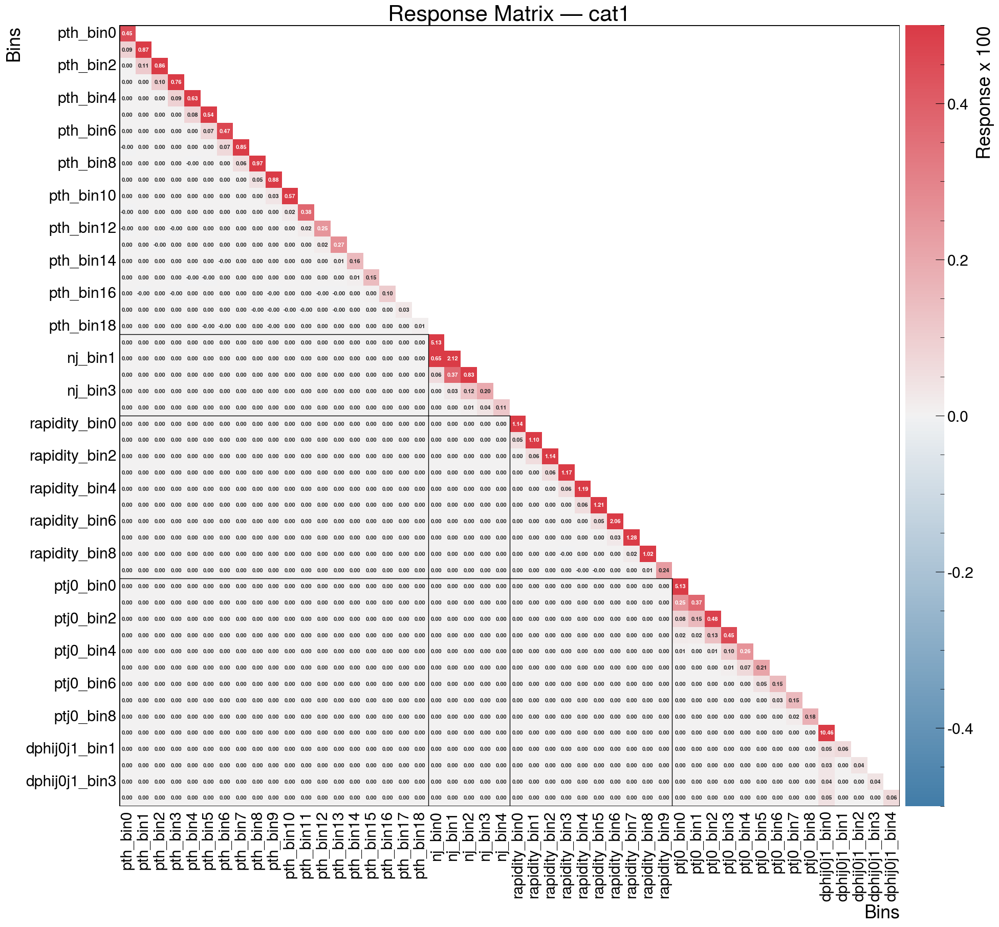

In [179]:
fig_corr, ax = plt.subplots(
    figsize=(24, 18),
    constrained_layout=True
)

cat = "cat1"

cmat = resp[cat]*100
corr_mask = np.triu(np.ones_like(cmat, dtype=bool), k=1)

sns.heatmap(
    cmat,
    ax=ax,
    cmap=palette,
    mask=corr_mask,
    vmin=-0.5,
    vmax=0.5,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"label": "Response x 100", "pad": 0.005},
)

ax.set_title(f"Response Matrix — {cat}")
ax.set_xlabel("Bins")
ax.set_ylabel("Bins")

_decorate_matrix_ax(ax, cmat.shape[0])

# plt.show()
plt.savefig(f"response_{cat}.pdf", dpi=300)

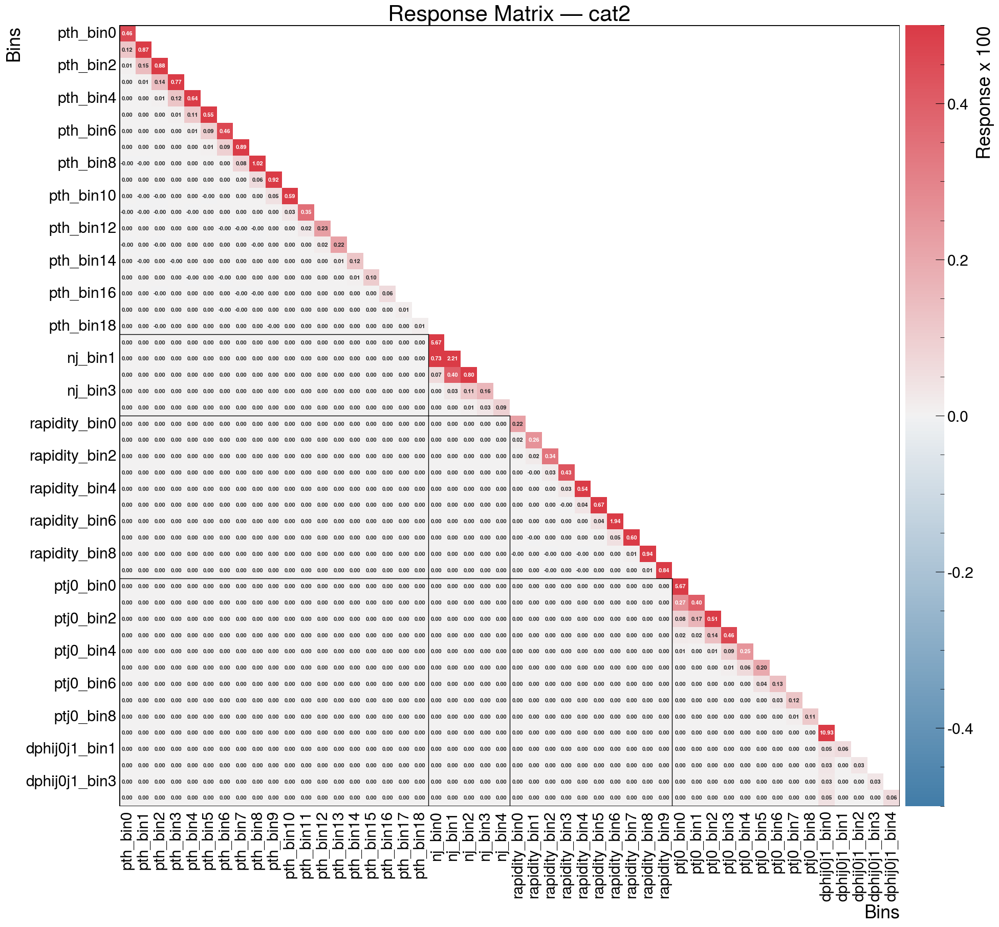

In [180]:
fig_corr, ax = plt.subplots(
    figsize=(24, 18),
    constrained_layout=True
)

cat = "cat2"

cmat = resp[cat]*100
corr_mask = np.triu(np.ones_like(cmat, dtype=bool), k=1)

sns.heatmap(
    cmat,
    ax=ax,
    cmap=palette,
    mask=corr_mask,
    vmin=-0.5,
    vmax=0.5,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"label": "Response x 100", "pad": 0.005},
)

ax.set_title(f"Response Matrix — {cat}")
ax.set_xlabel("Bins")
ax.set_ylabel("Bins")

_decorate_matrix_ax(ax, cmat.shape[0])

# plt.show()
plt.savefig(f"response_{cat}.pdf", dpi=300)

In [142]:
# resp["cat0"].loc["rapidity_bin7", "rapidity_bin7"] = 0.001
# resp["cat0"].loc["rapidity_bin8", "rapidity_bin8"] = 0.001
# resp["cat0"].loc["rapidity_bin9", "rapidity_bin9"] = 0.001

# resp["cat1"].loc["rapidity_bin7", "rapidity_bin7"] = 0.001
# resp["cat1"].loc["rapidity_bin8", "rapidity_bin8"] = 0.001
# resp["cat1"].loc["rapidity_bin9", "rapidity_bin9"] = 0.001

In [181]:
fisher_cat = {}

# Build the union of all row/column labels
all_rows = list(resp["cat2"].index)
all_cols = list(resp["cat2"].columns)


for cat in CAT:
    r = resp[cat]
    fisher_cat[cat] = r.T @ invert_matrix(cov) @ r # Without regularization of the covariance matrix before inversion
    # fisher_cat[cat] = r.T @ invert_matrix(tikhonov_regularize_for_inversion(cov[cat])[0]) @ r # With Tikhonov regularization before inversion

## Correlations per category
cov_gen_cat_0 = invert_matrix(fisher_cat["cat0"])
cov_gen_cat_1 = invert_matrix(fisher_cat["cat1"])
cov_gen_cat_2 = invert_matrix(fisher_cat["cat2"])
corr_gen_cat_0 = compute_corr(cov_gen_cat_0)
corr_gen_cat_1 = compute_corr(cov_gen_cat_1)
corr_gen_cat_2 = compute_corr(cov_gen_cat_2)

## Correlations per category using the formula without inversion of the correlation matrix
cov_gen_noinv_cat_0 = invert_matrix(resp['cat0']) @ cov @ invert_matrix(resp['cat0']).T
cov_gen_noinv_cat_1 = invert_matrix(resp['cat1']) @ cov @ invert_matrix(resp['cat1']).T
cov_gen_noinv_cat_2 = invert_matrix(resp['cat2']) @ cov @ invert_matrix(resp['cat2']).T
corr_gen_noinv_cat_0 = compute_corr(cov_gen_noinv_cat_0)
corr_gen_noinv_cat_1 = compute_corr(cov_gen_noinv_cat_1)
corr_gen_noinv_cat_2 = compute_corr(cov_gen_noinv_cat_2)

result = fisher_cat['cat2'].add(fisher_cat['cat1'], fill_value=0).add(fisher_cat['cat0'], fill_value=0)

## Correlations summing the three categories
cov_gen = invert_matrix(result)
# cov_gen = invert_matrix(tikhonov_regularize_for_inversion(fisher_cat["cat0"] + fisher_cat["cat1"] + fisher_cat["cat2"]))
cov_gen = pd.DataFrame(
    cov_gen,
    index=all_rows,
    columns=all_cols,
)

corr_gen = compute_corr(cov_gen)

####################################################################################################
# Checking the condition number of the various matrices
print("Covariance Inclusive: ", np.linalg.cond(cov), np.linalg.det(cov))
print("Response cat0: ", np.linalg.cond(resp["cat0"]), np.linalg.det(resp["cat0"]))
print("Response cat1: ", np.linalg.cond(resp["cat1"]), np.linalg.det(resp["cat1"]))
print("Response cat2: ", np.linalg.cond(resp["cat2"]), np.linalg.det(resp["cat2"]))
print("Sum of Fisher matrices: ", np.linalg.cond(result), np.linalg.det(result))



Covariance Inclusive:  29001.92446725776 1.5044437079092829e+178
Response cat0:  513.1587268112063 1.5375911054409846e-122
Response cat1:  1218.9184850304819 1.5099594934228972e-115
Response cat2:  848.1250777546592 9.455688174322078e-120
Sum of Fisher matrices:  478165.6799816517 0.0


In [182]:
def tikhonov_regularize_for_inversion(
    mat_df: pd.DataFrame,
    alpha_rel: float = 1e-5,
    symmetrize: bool = True
    ):
    A = mat_df.to_numpy(dtype=float)
    if A.shape[0] != A.shape[1]:
        raise ValueError("Input matrix must be square.")
    if symmetrize:
        A = 0.5 * (A + A.T)
    # Estimate a good lambda
    lambda_reg = alpha_rel * np.trace(A) / A.shape[0]  # scaled to mean diagonal

    # Regularize and invert
    A_reg = A + lambda_reg * np.eye(A.shape[0])
    # A_inv = np.linalg.inv(A_reg)
    A_reg = pd.DataFrame(A_reg, index=mat_df.index, columns=mat_df.columns)
    return A_reg


In [183]:
# plot_corr(corr_gen_cat_0)
# plot_corr(corr_gen_noinv_cat_0)
# print("--------------------------------")
# plot_corr(corr_gen_cat_1)
# plot_corr(corr_gen_noinv_cat_1)
# print("--------------------------------")
# plot_corr(corr_gen_cat_2)
# plot_corr(corr_gen_noinv_cat_2)
# print("--------------------------------")
# plot_corr(corr_gen)

Here I try the great idea we had with Mauro, combining the covariance and response matrices

In [146]:
# cov["cat0"] = cov["cat0"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])
# cov["cat1"] = cov["cat1"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])
# cov["cat2"] = cov["cat2"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])

# resp["cat0"] = resp["cat0"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])
# resp["cat1"] = resp["cat1"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])
# resp["cat2"] = resp["cat2"].drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])



# cov["cat0"] = cov["cat0"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])
# cov["cat1"] = cov["cat1"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])
# cov["cat2"] = cov["cat2"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])

# resp["cat0"] = resp["cat0"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])
# resp["cat1"] = resp["cat1"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])
# resp["cat2"] = resp["cat2"].drop(index=["dphij0j1_bin0"], columns=["dphij0j1_bin0"])



793.8744129346774
['pth_bin0', 'pth_bin1', 'pth_bin2', 'pth_bin3', 'pth_bin4', 'pth_bin5', 'pth_bin6', 'pth_bin7', 'pth_bin8', 'pth_bin9', 'pth_bin10', 'pth_bin11', 'pth_bin12', 'pth_bin13', 'pth_bin14', 'pth_bin15', 'pth_bin16', 'pth_bin17', 'pth_bin18', 'nj_bin0', 'nj_bin1', 'nj_bin2', 'nj_bin3', 'nj_bin4', 'rapidity_bin0', 'rapidity_bin1', 'rapidity_bin2', 'rapidity_bin3', 'rapidity_bin4', 'rapidity_bin5', 'rapidity_bin6', 'rapidity_bin7', 'rapidity_bin8', 'rapidity_bin9', 'ptj0_bin0', 'ptj0_bin1', 'ptj0_bin2', 'ptj0_bin3', 'ptj0_bin4', 'ptj0_bin5', 'ptj0_bin6', 'ptj0_bin7', 'ptj0_bin8', 'dphij0j1_bin0', 'dphij0j1_bin1', 'dphij0j1_bin2', 'dphij0j1_bin3', 'dphij0j1_bin4']


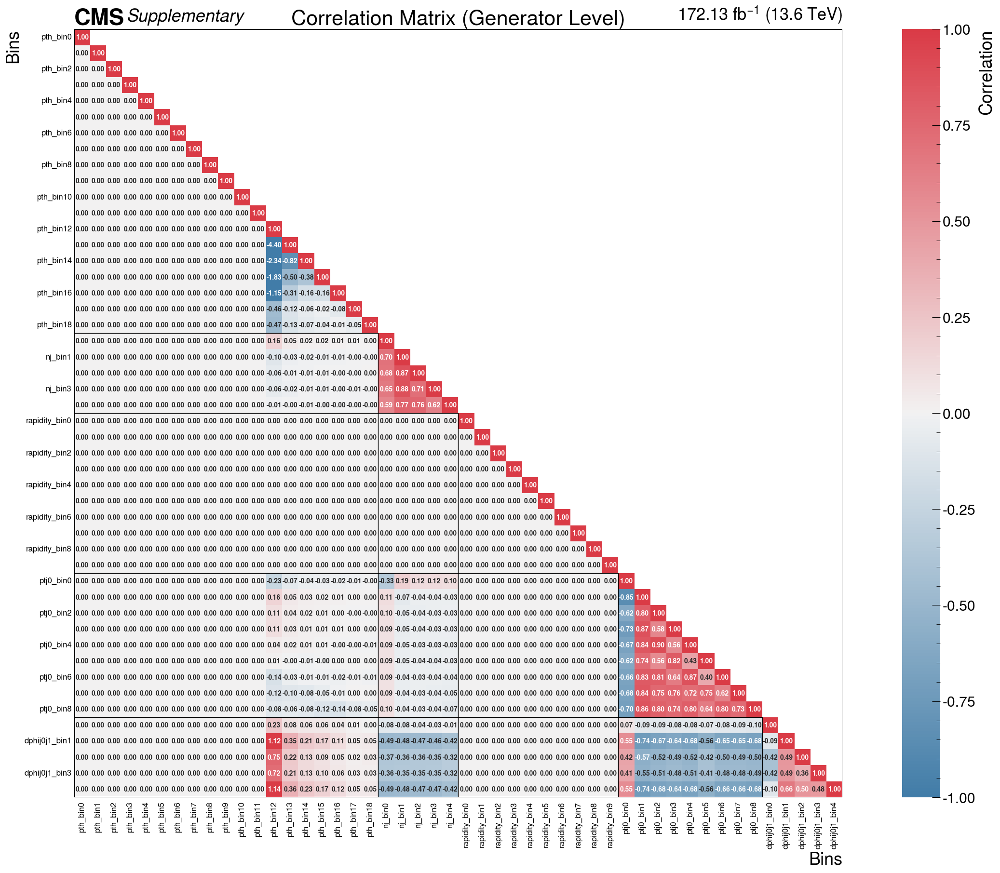

In [195]:
## Compute the combined response matrix
## It is done by combining the covariance matrices of three independent measurements 
## cov_weighed = (cov["cat0"]^-1 + cov["cat1"]^-1 + cov["cat2"]^-1)^-1
cov_weighed = invert_matrix(cov)
# plot_corr(corr_from_cov(cov_weighed))
# ## Compute the combined response matrix
# ## It is done by taking the weighed average element by element of the three response matrices
# ## The weights correspond to the corresponding covariances
cats = ["cat0", "cat1", "cat2"]
# R = np.stack([np.asarray(resp[c], float) for c in cats])   
# V = np.stack([np.asarray(cov[c],  float) for c in cats])   
# w = 1.0 / np.clip(V, 1e-15, None)                         
# resp_combined = np.sum(w * R, axis=0) / np.sum(w, axis=0)
# resp_combined = pd.DataFrame(resp_combined, index=resp["cat0"].index, columns=resp["cat0"].columns)


# Build the union of all row/column labels
all_rows = list(resp["cat0"].index)
all_cols = list(resp["cat0"].columns)

# Align all matrices to the same shape
R = np.stack([
    resp[c].reindex(index=all_rows, columns=all_cols, fill_value=0).to_numpy(float)
    for c in cats
])

V = np.stack([
    cov.reindex(index=all_rows, columns=all_cols, fill_value=np.inf).to_numpy(float)
    for c in cats
])

# Inverse-variance weights
w = 1.0 / np.clip(V, 1e-15, None)

# Weighted average
resp_combined = np.sum(w * R, axis=0) / np.sum(w, axis=0)

# Convert back to DataFrame
resp_combined = pd.DataFrame(
    resp_combined,
    index=all_rows,
    columns=all_cols,
)
print(np.linalg.cond(resp_combined))

cov_gen_weighed = invert_matrix(resp_combined) @ cov_weighed @ invert_matrix(resp_combined).T

print(all_rows)

plot_corr(corr_from_cov(cov_gen_weighed))

In [185]:
def _robust_cholesky(C, regularisation=1e-10, max_tries=8):
    C = np.asarray(C, dtype=float)
    C = 0.5 * (C + C.T)  # enforce symmetry
    scale = max(np.linalg.norm(C, ord=2), 1.0)
    eps = regularisation * scale
    I = np.eye(C.shape[0])
    for _ in range(max_tries):
        print("iteration for cholesky with eps = ", eps)
        try:
            return np.linalg.cholesky(C + eps * I), eps
        except np.linalg.LinAlgError:
            eps *= 10.0
    print("Fallback solution for computing the Cholesky decomposition")
    # Fallback: eigenvalue clipping to nearest SPD-like matrix
    w, v = np.linalg.eigh(C)
    w = np.clip(w, eps, None)
    C_spd = (v * w) @ v.T
    return np.linalg.cholesky(C_spd), eps


# def compute_C_gen(R_list, C_list, bin_names=None, regularisation=1e-10):
#     """
#     Compute the gen-level statistical covariance and correlation matrices.

#     Parameters
#     ----------
#     R_list         : list of K arrays, each (n_reco_k, n_gen)
#     C_list         : list of K arrays, each (n_reco_k, n_reco_k)
#     bin_names      : list of n_gen strings for row/column labels (optional)
#     regularisation : float, diagonal loading factor (default 1e-10)

#     Returns
#     -------
#     dict with keys:
#         "covariance"   : pd.DataFrame (n_gen x n_gen)
#         "correlation"  : pd.DataFrame (n_gen x n_gen)
#     """

#     R_tilde_list = []
#     for k, (R_k, C_k) in enumerate(zip(R_list, C_list)):
#         # L_k = np.linalg.cholesky(C_k)
#         L_k, eps_used = _robust_cholesky(C_k, regularisation=regularisation)
#         R_tilde_list.append(solve_triangular(L_k, np.asarray(R_k, float), lower=True))

#     R_tot   = np.vstack(R_tilde_list)
#     _, R_QR = qr(R_tot, mode='economic')

#     n_gen    = R_QR.shape[0]
#     R_QR_inv = solve_triangular(R_QR, np.eye(n_gen), lower=False)
#     C_gen    = R_QR_inv @ R_QR_inv.T

#     std  = np.sqrt(np.diag(C_gen))
#     corr = np.clip(C_gen / np.outer(std, std), -1.0, 1.0)

#     # Build labels
#     if bin_names is None:
#         bin_names = [f"bin{i}" for i in range(n_gen)]

#     return {
#         "covariance"  : pd.DataFrame(C_gen, index=bin_names, columns=bin_names),
#         "correlation" : pd.DataFrame(corr,  index=bin_names, columns=bin_names),
#     }

def compute_C_gen(R_list, C_list, bin_names=None, regularisation=1e-10):
    """
    Compute the gen-level statistical covariance and correlation matrices.

    Parameters
    ----------
    R_list         : list of response matrices (DataFrames or arrays)
                     each shaped (n_reco_k, n_gen_k)
    C_list         : list of reco covariance matrices
                     each shaped (n_reco_k, n_reco_k)
    bin_names      : optional ordered list of gen-bin labels
    regularisation : float, diagonal loading factor

    Returns
    -------
    dict with keys:
        "covariance"   : pd.DataFrame
        "correlation"  : pd.DataFrame
    """

    # ---------------------------------------------------------
    # Determine common gen-bin ordering
    # Preserve ordering from first matrix, append missing bins
    # ---------------------------------------------------------

    if isinstance(R_list[0], pd.DataFrame):
        all_gen_bins = list(R_list[0].columns)

        for R in R_list[1:]:
            for col in R.columns:
                if col not in all_gen_bins:
                    all_gen_bins.append(col)
    else:
        if bin_names is None:
            raise ValueError(
                "bin_names must be provided when R_list elements are not DataFrames"
            )
        all_gen_bins = list(bin_names)

    # ---------------------------------------------------------
    # Build whitened response matrices
    # ---------------------------------------------------------

    R_tilde_list = []

    for k, (R_k, C_k) in enumerate(zip(R_list, C_list)):

        # ---------------------------------------------
        # Align response matrix columns
        # Missing bins are filled with zeros
        # ---------------------------------------------

        if isinstance(R_k, pd.DataFrame):
            R_k = (
                R_k
                .reindex(columns=all_gen_bins, fill_value=0)
                .to_numpy(float)
            )
        else:
            R_k = np.asarray(R_k, float)

        # ---------------------------------------------
        # Convert covariance matrix
        # ---------------------------------------------

        if isinstance(C_k, pd.DataFrame):
            C_k = C_k.to_numpy(float)
        else:
            C_k = np.asarray(C_k, float)

        # ---------------------------------------------
        # Robust Cholesky whitening
        # ---------------------------------------------

        L_k, eps_used = _robust_cholesky(
            C_k,
            regularisation=regularisation
        )

        R_tilde_k = solve_triangular(
            L_k,
            R_k,
            lower=True
        )

        R_tilde_list.append(R_tilde_k)

    # ---------------------------------------------------------
    # Stack all categories
    # Shape: (sum reco bins, n_gen_total)
    # ---------------------------------------------------------

    R_tot = np.vstack(R_tilde_list)

    # ---------------------------------------------------------
    # QR decomposition
    # ---------------------------------------------------------

    _, R_QR = qr(R_tot, mode='economic')

    n_gen = R_QR.shape[0]

    # ---------------------------------------------------------
    # Compute covariance
    # ---------------------------------------------------------

    R_QR_inv = solve_triangular(
        R_QR,
        np.eye(n_gen),
        lower=False
    )

    C_gen = R_QR_inv @ R_QR_inv.T

    # ---------------------------------------------------------
    # Correlation matrix
    # ---------------------------------------------------------

    std = np.sqrt(np.diag(C_gen))

    corr = np.clip(
        C_gen / np.outer(std, std),
        -1.0,
        1.0
    )

    # ---------------------------------------------------------
    # Labels
    # ---------------------------------------------------------

    if bin_names is None:
        bin_names = all_gen_bins

    return {
        "covariance": pd.DataFrame(
            C_gen,
            index=bin_names,
            columns=bin_names
        ),

        "correlation": pd.DataFrame(
            corr,
            index=bin_names,
            columns=bin_names
        ),
    }

In [197]:
mat_cholesky = compute_C_gen(
    # [resp["cat0"], resp["cat1"], resp["cat2"]],
    # [cov, cov, cov],
    [resp_combined],
    [cov],
    bin_names = cov.index,
    regularisation=1e-10 # 1e-10
)

iteration for cholesky with eps =  6.669200789933011e-05
iteration for cholesky with eps =  0.000666920078993301
iteration for cholesky with eps =  0.006669200789933011
iteration for cholesky with eps =  0.06669200789933011
iteration for cholesky with eps =  0.6669200789933011
iteration for cholesky with eps =  6.669200789933011
iteration for cholesky with eps =  66.69200789933011
iteration for cholesky with eps =  666.9200789933011


In [198]:
cor_cholesky = mat_cholesky["correlation"]
# label_to_drop = [cor_cholesky.index[34],cor_cholesky.index[43]]
# cor_cholesky_red = cor_cholesky.drop(index=label_to_drop, columns=label_to_drop)


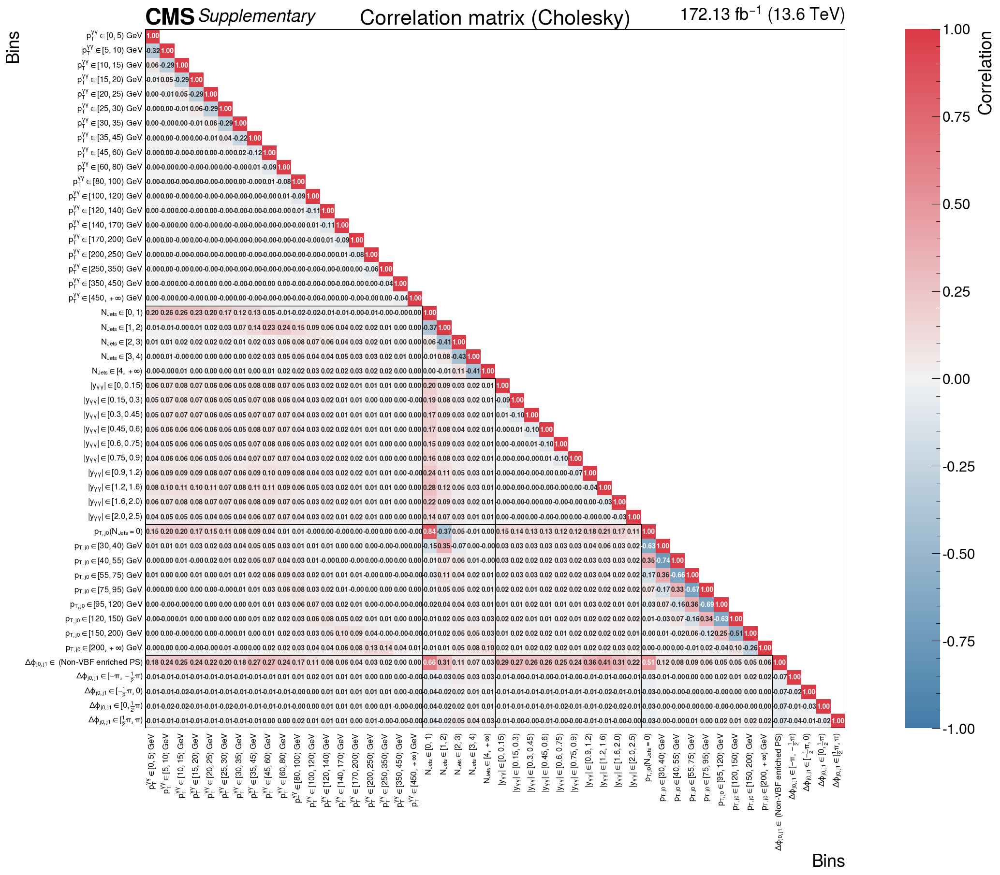

In [199]:
# plot_corr(cor_cholesky, title="Correlation matrix (Cholesky)", save_path="correlation_matrix_cholesky.pdf", label_map=label_map, n_b4=b4-1)
plot_corr(cor_cholesky, title="Correlation matrix (Cholesky)", save_path="correlation_matrix_cholesky.pdf", label_map=label_map, n_b4=b4)

### Adding systematic uncertainties

In [152]:
with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_PTJ0.json", "r") as f:
    impacts_ptJ0 = json.load(f)

with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_PTH.json", "r") as f:
    impacts_PTH = json.load(f)

with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_NJ.json", "r") as f:
    impacts_NJ = json.load(f)

with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_YH.json", "r") as f:
    impacts_YH = json.load(f)

with open ("/t3home/niharrin/devel/work/devel/RCR_Matrix/impacts/impacts_DPhiJ0J1.json", "r") as f:
    impacts_DPhiJ0J1 = json.load(f)

In [153]:
nuis_params = set()
# Printout the list of nuisance parameters
# For debugging purposes
# with open("impact_param_names.txt", "w") as f:
#   f.write("[PTH]\n")
#   f.writelines(p["name"] + "\n" for p in impacts_PTH["params"])
#   f.write("\n[NJ]\n")
#   f.writelines(p["name"] + "\n" for p in impacts_NJ["params"])
#   f.write("\n[ptJ0]\n")
#   f.writelines(p["name"] + "\n" for p in impacts_ptJ0["params"])
#   f.write("\n[YH]\n")
#   f.writelines(p["name"] + "\n" for p in impacts_YH["params"])

sections = {
    "PTH": impacts_PTH,
    "NJ": impacts_NJ,
    "ptJ0": impacts_ptJ0,
    "YH": impacts_YH,
    "DPhiJ0J1": impacts_DPhiJ0J1,
}

with open("impact_param_names.txt", "w") as f:
    for label, impacts in sections.items():
        f.write(f"[{label}]\n")

        for p in impacts.get("params", []):
            name = p.get("name", "")
            f.write(name + "\n")
            nuis_params.add(name)

        f.write("\n")

nuis_params = sorted(nuis_params)  # optional: deterministic order

In [154]:
nuis_params

['CMS_hgg_AlphaS_shape',
 'CMS_hgg_ElectronVetoSF_2022postEE',
 'CMS_hgg_ElectronVetoSF_2022preEE',
 'CMS_hgg_ElectronVetoSF_2023postBPix',
 'CMS_hgg_ElectronVetoSF_2023preBPix',
 'CMS_hgg_ElectronVetoSF_2024',
 'CMS_hgg_PS_FSR_shape',
 'CMS_hgg_PS_ISR_shape',
 'CMS_hgg_PileupWeight',
 'CMS_hgg_PreselSF',
 'CMS_hgg_SigmaEOverEShift',
 'CMS_hgg_TriggerWeight',
 'CMS_hgg_nuisance_ScaleEBZee_2022postEE',
 'CMS_hgg_nuisance_ScaleEBZee_2022preEE',
 'CMS_hgg_nuisance_ScaleEBZee_2023postBPix',
 'CMS_hgg_nuisance_ScaleEBZee_2023preBPix',
 'CMS_hgg_nuisance_ScaleEBZee_2024',
 'CMS_hgg_nuisance_ScaleEBZmmg_2022_2023',
 'CMS_hgg_nuisance_ScaleEBZmmg_2024',
 'CMS_hgg_nuisance_ScaleEEZee_2022postEE',
 'CMS_hgg_nuisance_ScaleEEZee_2022preEE',
 'CMS_hgg_nuisance_ScaleEEZee_2023postBPix',
 'CMS_hgg_nuisance_ScaleEEZee_2023preBPix',
 'CMS_hgg_nuisance_ScaleEEZee_2024',
 'CMS_hgg_nuisance_ScaleEEZmmg_2022_2023',
 'CMS_hgg_nuisance_ScaleEEZmmg_2024',
 'CMS_hgg_nuisance_Smearing_2022postEE',
 'CMS_hgg_nui

In [155]:
import json

pois = {
    "PTH": ["r_PTH_0p0_5p0","r_PTH_5p0_10p0","r_PTH_10p0_15p0","r_PTH_15p0_20p0","r_PTH_20p0_25p0","r_PTH_25p0_30p0","r_PTH_30p0_35p0","r_PTH_35p0_45p0","r_PTH_45p0_60p0","r_PTH_60p0_80p0","r_PTH_80p0_100p0","r_PTH_100p0_120p0","r_PTH_120p0_140p0","r_PTH_140p0_170p0","r_PTH_170p0_200p0","r_PTH_200p0_250p0","r_PTH_250p0_350p0","r_PTH_350p0_450p0","r_PTH_450p0_10000p0"],
    "NJ": ["r_NJ_0p0_1p0", "r_NJ_1p0_2p0", "r_NJ_2p0_3p0", "r_NJ_3p0_4p0", "r_NJ_4p0_100p0"],
    "PTJ0": ["r_PTJ0_m10000p0_30p0", "r_PTJ0_30p0_40p0", "r_PTJ0_40p0_55p0", "r_PTJ0_55p0_75p0", "r_PTJ0_75p0_95p0", "r_PTJ0_95p0_120p0", "r_PTJ0_120p0_150p0", "r_PTJ0_150p0_200p0", "r_PTJ0_200p0_10000p0"],
    "YH": ["r_YH_0p0_0p15", "r_YH_0p15_0p3", "r_YH_0p3_0p45", "r_YH_0p45_0p6", "r_YH_0p6_0p75", "r_YH_0p75_0p9", "r_YH_0p9_1p2", "r_YH_1p2_1p6", "r_YH_1p6_2p0", "r_YH_2p0_2p5"],
    "DPhiJ0J1": ["r_DPhiJ0J1_m3p1416_3p1416_underflow", "r_DPhiJ0J1_m3p1416_m1p5708", "r_DPhiJ0J1_m1p5708_0p0", "r_DPhiJ0J1_0p0_1p5708", "r_DPhiJ0J1_1p5708_3p1416"],       
}

In [156]:
idx_ptJ0 = {p["name"]: p for p in impacts_ptJ0["params"]}
idx_PTH  = {p["name"]: p for p in impacts_PTH["params"]}
idx_NJ   = {p["name"]: p for p in impacts_NJ["params"]}
idx_YH   = {p["name"]: p for p in impacts_YH["params"]}
idx_DPhiJ0J1   = {p["name"]: p for p in impacts_DPhiJ0J1["params"]}

def variation(v):
    v0, v1, v2 = map(float, v)
    d1 = v2 - v1   # +1σ
    d2 = v0 - v1   # -1σ
    return np.sign(d1) * max(abs(d1), abs(d2))
    # return (d1 - d2) / 2
    # return d1

def block_vector(entry, pois):
    if entry is None:
        return [0.0] * len(pois)
    return [variation(entry[poi]) if poi in entry else 0.0 for poi in pois]

nuis_to_vector = {}
for n in nuis_params:  # full list you provide
    e_PTH  = idx_PTH.get(n)     # None if missing
    e_NJ   = idx_NJ.get(n)
    e_ptJ0 = idx_ptJ0.get(n)
    e_YH = idx_YH.get(n)
    e_DPhiJ0J1 = idx_DPhiJ0J1.get(n)
    vec = (
        block_vector(e_PTH,  pois["PTH"]) +
        block_vector(e_NJ,   pois["NJ"]) +
        block_vector(e_ptJ0, pois["PTJ0"]) +
        block_vector(e_YH, pois["YH"]) +
        block_vector(e_DPhiJ0J1, pois["DPhiJ0J1"])
    )
    nuis_to_vector[n] = np.array(vec, dtype=float).reshape(-1, 1)  # vertical


In [157]:
## After this cell you have syst_matrix and syst_matrix_reduced
n_entries = len(pois["PTJ0"]) + len(pois["PTH"]) + len(pois["NJ"]) + len(pois["YH"]) + len(pois["DPhiJ0J1"]) 
syst_matrix = np.zeros((n_entries, n_entries))
for nuis in nuis_params:
# for nuis in ["CMS_scale_j_2022postEE", "CMS_scale_j_2022preEE"]:
    syst_matrix += nuis_to_vector[nuis] @ nuis_to_vector[nuis].T

syst_matrix = pd.DataFrame(syst_matrix, index=cor_cholesky.index, columns=cor_cholesky.columns)
syst_matrix.index = cor_cholesky.index
syst_matrix.columns = cor_cholesky.index

In [158]:
def find_crossings(x_vals, y_vals, threshold=1.0):
    # Find where the difference changes sign
    y_vals = np.array(y_vals)  # ← add this line
    signs = np.sign(y_vals - threshold)
    crossings = []
    for i in range(len(signs)-1):
        if signs[i] * signs[i+1] <= 0:  # Sign change detected
            # Linear interpolation
            x1, x2 = x_vals[i], x_vals[i+1]
            y1, y2 = y_vals[i], y_vals[i+1]
            if y1 != y2:  # Avoid division by zero
                x_cross = x1 + (x2-x1) * (threshold-y1)/(y2-y1)
                crossings.append(x_cross)
    return crossings

In [159]:
# I wanna derive the uncertainties based off the fidXS calculator and the scans

# TARGET_MODES = {"ggH", "VBFH", "VH", "ttH"}

# FILE_RE = re.compile(
#     r"^fidXS_(?P<obs>NJ|PTH|PTJ0|YH|DPhiJ0J1)_(?P<mode>ggH|VBFH|VH|ttH)\.py$"
# )

# def load_python_module(path: Path):
#     spec = importlib.util.spec_from_file_location(path.stem, path)
#     if spec is None or spec.loader is None:
#         raise RuntimeError(f"Cannot load file: {path}")
#     module = importlib.util.module_from_spec(spec)
#     spec.loader.exec_module(module)
#     return module

# unc_total = {
#     "PTH": [],
#     "NJ": [],
#     "PTJ0": [],
#     "YH": [],
#     "DPhiJ0J1": [],
# }

# fidXS_sum = {
#     "PTH": None,
#     "NJ": None,
#     "PTJ0": None,
#     "YH": None,
#     "DPhiJ0J1": None
# }

# fidXS_folder = Path("fidXS")

# for path in fidXS_folder.iterdir():
#     match = FILE_RE.match(path.name)
#     if not match:
#         continue

#     obs = match.group("obs")
#     mode = match.group("mode")

#     if mode not in TARGET_MODES:
#         continue

#     module = load_python_module(path)

#     if not hasattr(module, "fidXS"):
#         print(f"Skipping {path.name}: no fidXS vector")
#         continue

#     fid_xs = np.array(list(module.fidXS))  # convert once to numpy

#     # initialize accumulator
#     if fidXS_sum[obs] is None:
#         fidXS_sum[obs] = fid_xs.copy()
#     else:
#         # safety check: bin consistency
#         if fidXS_sum[obs].shape != fid_xs.shape:
#             raise ValueError(
#                 f"Bin mismatch in {path.name}: "
#                 f"{fidXS_sum[obs].shape} vs {fid_xs.shape}"
#             )

#         fidXS_sum[obs] += fid_xs

# # Load the scans and extract the 1 sigmas
# blinded = True

# if blinded:
#     scan_folder = {
#         "PTH": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/PTH/Combine/runFits_PTH/asimov/scans",
#         "NJ": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/NJ/Combine/runFits_NJ/asimov/scans",
#         "PTJ0": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/PTJ0/Combine/runFits_PTJ0/asimov/scans",
#         "YH": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/rapidity/Combine/runFits_rapidity/asimov/scans",
#         "DPhiJ0J1": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/DPhiJ0J1/Combine/runFits_DPhiJ0J1/asimov/scans",
#     }
# else:
#     scan_folder = {
#         "PTH": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/PTH/Combine/runFits_PTH/data/scans",
#         "NJ": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/NJ/Combine/runFits_NJ/data/scans",
#         "PTJ0": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/PTJ0/Combine/runFits_PTJ0/data/scans",
#         "YH": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/rapidity/Combine/runFits_rapidity/data/scans",
#         "DPhiJ0J1": "/pnfs/psi.ch/cms/trivcat/store/user/niharrin/ntuples/midRun3/samples/2026_04_27_with_Zmmg_SaS/final_fits_outputs/DPhiJ0J1/Combine/runFits_DPhiJ0J1/data/scans",
#     }



# for poi in pois.keys():

#     for i, current_bin in enumerate(pois[poi]):
#         try:
#             with uproot.open(os.path.join(scan_folder[poi].replace("YH", "rapidity"), f"scan_{current_bin}.root")) as file:
                
#                 # Get the TGraphs - note that uproot reads them as pairs of arrays
#                 graph = file[f"scan_{current_bin};1"]  # Replace with your TGraph name
#                 # Extract x and y values
#                 x0_points = graph.member("fX")  # Gets x values
#                 y0_points = graph.member("fY")  # Gets y values
#         except:
#             print(f"Error: Could not load scan for {current_bin} from {scan_folder[poi]}. Perhaps run unblinded scans first. Skipping this bin.")
#             continue

#         mu_hat = x0_points[np.argmin(y0_points)] # Consider an Asimov dataset
#         # print("XS crossings", find_crossings(x0_points, y0_points))
#         if len(find_crossings(x0_points, y0_points)) != 2:
#             print(f"Warning: Expected two crossings for {current_bin}, found {len(find_crossings(x0_points, y0_points))}.")
#             if len(find_crossings(x0_points, y0_points)) == 1:
#                 print("Only one crossing found. Assuming symmetric shape and extracting only the one point.")
#                 crossing = find_crossings(x0_points, y0_points)[0]
#             else:
#                 crossing_minus, crossing_plus = find_crossings(x0_points, y0_points)[-2:]  # Use the last two crossings
#         else:
#             crossing_minus, crossing_plus = find_crossings(x0_points, y0_points)
        
#         if len(find_crossings(x0_points, y0_points)) == 1:
#             sigma_minus = mu_hat - crossing
#             sigma_plus = crossing - mu_hat
#         else:
#             sigma_minus = mu_hat - crossing_minus
#             sigma_plus = crossing_plus - mu_hat
            
#         fidXS_low = fidXS_sum[poi][i] * sigma_minus
#         fidXS_high = fidXS_sum[poi][i] * sigma_plus
        
#         unc_total[poi].append(fidXS_high)



fidXS_PTH = [3.251514094855517, 6.413825763609831, 6.555809968521467, 5.889800810939074, 5.099083112515962, 4.421885114513488, 3.866226543790849, 6.441680337807897, 6.902988952146682, 5.9025422289283505, 3.8146832368240626, 2.5035992765212907, 1.728313772250199, 1.7476552427460155, 1.0831025476943583, 1.0182794676925542, 0.8199434493201138, 0.25644320024731754, 0.16456440773573974]
fidXS_NJ = [36.46013279924294, 19.39595337442149, 8.780897688557815, 2.1285339711776765, 1.117648241828872]
fidXS_PTJ0 = [36.46013279924294, 6.663873021305533, 7.050146523728949, 5.894645706317997, 3.654783295750552, 2.8293975792219843, 1.990389506704825, 1.6537018867095121, 1.6860957562438337] 
fidXS_YH = [6.571010820445315, 6.4878499407752805, 6.374530083157725, 6.159720064093899, 5.79610179997262, 5.471530119936904, 9.913956621106973, 10.81253639411838, 7.0842765398757725, 3.211653691747486]
fidXS_DPhiJ0J1 = [65.21952099254116, 0.8106934454948248, 0.5284340993292949, 0.5398399759381666, 0.7845488948952335] # Contains underflow bin
# fidXS_DPhiJ0J1 = [0.8106934454948248, 0.5284340993292949, 0.5398399759381666, 0.7845488948952335] # Does NOT contains underflow bin

# We always take the bigger ones to be more conservative
uncMu_total_PTH = [0.481, 0.339, 0.355, 0.365, 0.410, 0.446, 0.457, 0.300, 0.258, 0.249, 0.260, 0.284, 0.305, 0.251, 0.287, 0.259, 0.259, 0.429, 0.582]
uncMu_stat_PTH = [0.480, 0.337, 0.354, 0.364, 0.406, 0.442, 0.455, 0.298, 0.256, 0.247, 0.258, 0.283, 0.304, 0.250, 0.285, 0.258, 0.258, 0.427, 0.580]
unc_total_PTH = [uncMu_total_PTH[i]*currentXS for i, currentXS in enumerate(fidXS_PTH)]
unc_stat_PTH = [uncMu_stat_PTH[i]*currentXS for i, currentXS in enumerate(fidXS_PTH)]
unc_syst_PTH = [np.sqrt(unc_total_PTH[i]**2 - unc_stat_PTH[i]**2) for i, _ in enumerate(unc_total_PTH)]

uncMu_total_NJ = [0.150, 0.223, 0.315, 0.672, 0.619]
uncMu_stat_NJ = [0.145, 0.220, 0.311, 0.665, 0.614]
unc_total_NJ = [uncMu_total_NJ[i]*currentXS for i, currentXS in enumerate(fidXS_NJ)]
unc_stat_NJ = [uncMu_stat_NJ[i]*currentXS for i, currentXS in enumerate(fidXS_NJ)]
unc_syst_NJ = [np.sqrt(unc_total_NJ[i]**2 - unc_stat_NJ[i]**2) for i, _ in enumerate(unc_total_NJ)]

uncMu_total_PTJ0 = [0.163, 0.958, 0.841, 0.751, 0.964, 0.927, 0.854, 0.594, 0.349]
uncMu_stat_PTJ0 = [0.155, 0.954, 0.836, 0.747, 0.960, 0.922, 0.851, 0.591, 0.346]
unc_total_PTJ0 = [uncMu_total_PTJ0[i]*currentXS for i, currentXS in enumerate(fidXS_PTJ0)]
unc_stat_PTJ0 = [uncMu_stat_PTJ0[i]*currentXS for i, currentXS in enumerate(fidXS_PTJ0)]
unc_syst_PTJ0 = [np.sqrt(unc_total_PTJ0[i]**2 - unc_stat_PTJ0[i]**2) for i, _ in enumerate(unc_total_PTJ0)]

uncMu_total_YH = [0.190, 0.202, 0.211, 0.227, 0.253, 0.273, 0.236, 0.305, 0.411, 0.709]
uncMu_stat_YH = [0.188, 0.201, 0.210, 0.226, 0.252, 0.271, 0.234, 0.303, 0.409, 0.706]
unc_total_YH = [uncMu_total_YH[i]*currentXS for i, currentXS in enumerate(fidXS_YH)]
unc_stat_YH = [uncMu_stat_YH[i]*currentXS for i, currentXS in enumerate(fidXS_YH)]
unc_syst_YH = [np.sqrt(unc_total_YH[i]**2 - unc_stat_YH[i]**2) for i, _ in enumerate(unc_total_YH)]

uncMu_total_DPhiJ0J1 = [0.088, 0.616, 0.571, 0.566, 0.646]
uncMu_stat_DPhiJ0J1 = [0.083, 0.610, 0.563, 0.557, 0.640]
unc_total_DPhiJ0J1 = [uncMu_total_DPhiJ0J1[i]*currentXS for i, currentXS in enumerate(fidXS_DPhiJ0J1)]
unc_stat_DPhiJ0J1 = [uncMu_stat_DPhiJ0J1[i]*currentXS for i, currentXS in enumerate(fidXS_DPhiJ0J1)]
unc_syst_DPhiJ0J1 = [np.sqrt(unc_total_DPhiJ0J1[i]**2 - unc_stat_DPhiJ0J1[i]**2) for i, _ in enumerate(unc_total_DPhiJ0J1)]


# Mangels Geduld... (to be changed)
# unc_stat_syst = unc_total["PTH"] + unc_total["NJ"] + unc_total["PTJ0"] + unc_total["YH"]

unc_stat = unc_stat_PTH + unc_stat_NJ + unc_stat_YH + unc_stat_PTJ0 + unc_stat_DPhiJ0J1
unc_syst = unc_syst_PTH + unc_syst_NJ + unc_syst_YH + unc_syst_PTJ0 + unc_syst_DPhiJ0J1


In [160]:
cov_stat = cor_cholesky * np.outer(unc_stat, unc_stat)
cov_syst = syst_matrix * np.outer(unc_syst, unc_syst)

# Remove underflow bin of PTJ0
cov_stat = cov_stat.drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])
cov_syst = cov_syst.drop(index=["ptj0_bin0", "dphij0j1_bin0"], columns=["ptj0_bin0", "dphij0j1_bin0"])

# cov_stat = cor_cholesky * np.outer(unc_stat_syst, unc_stat_syst)
# cov_syst = syst_matrix * np.outer(unc_stat_syst, unc_stat_syst)
cov_tot = cov_stat + cov_syst
corr_tot = corr_from_cov(cov_tot)
# plot_corr(corr_tot, title="Total correlation matrix (stat + syst)", save_path="correlation_matrix_statsyst_combined.pdf", label_map=label_map, n_b4=b4-1)

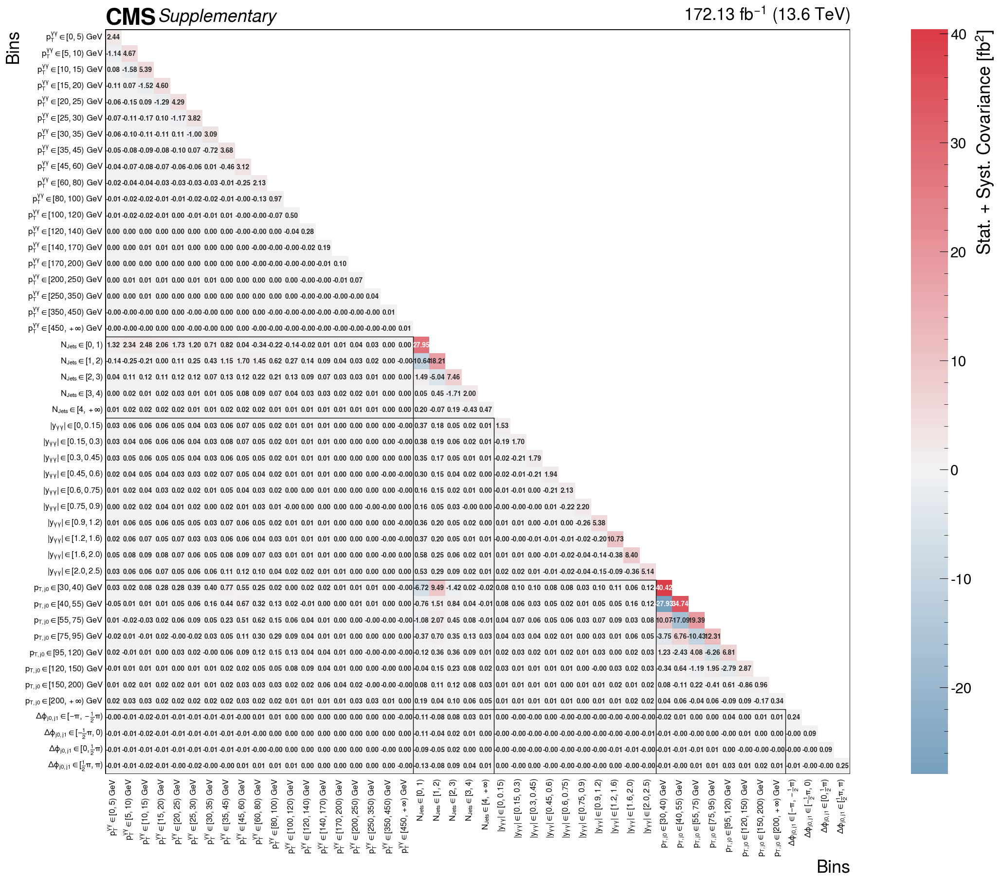

In [161]:
plot_cov(cov_tot, title="", save_path="covariance_matrix_statsyst_combined.pdf", plot_label=r"Stat. + Syst. Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b4=b4-1)

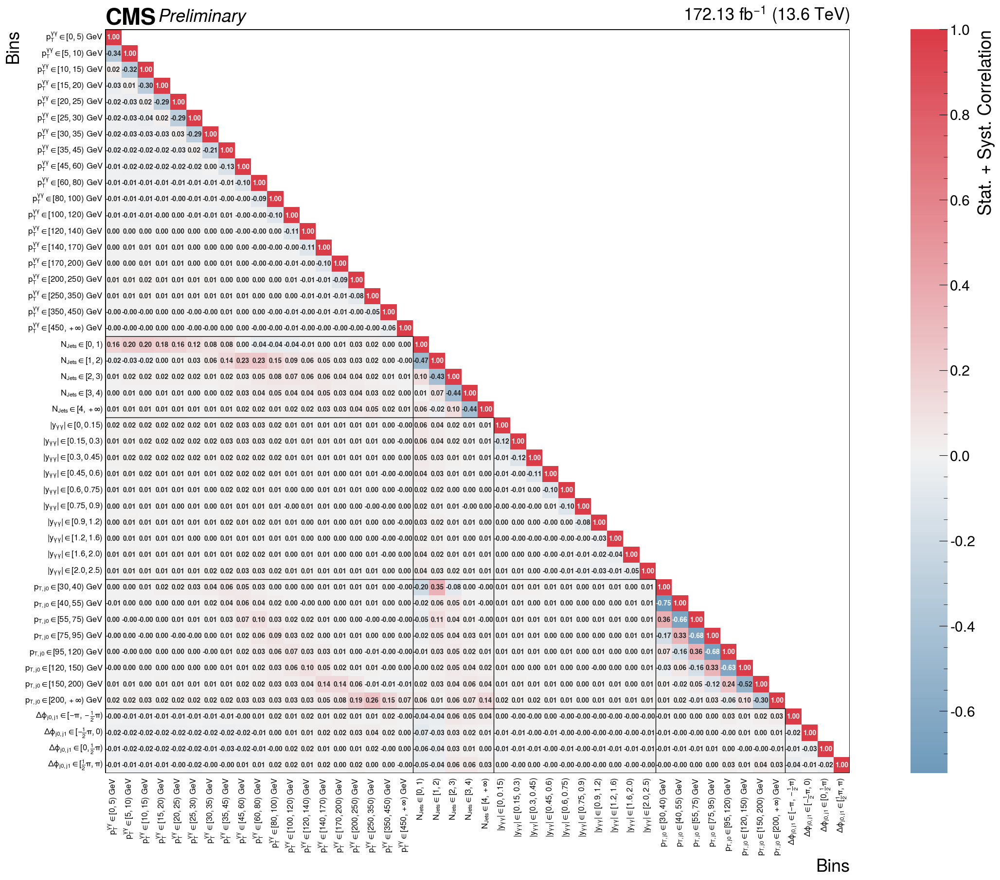

In [162]:
plot_cov(corr_tot, title="", save_path="correlation_matrix_statsyst_combined.pdf", cms_label="Preliminary", plot_label=r"Stat. + Syst. Correlation", apply_translation=True, label_map=label_map, n_b4=b4-1)

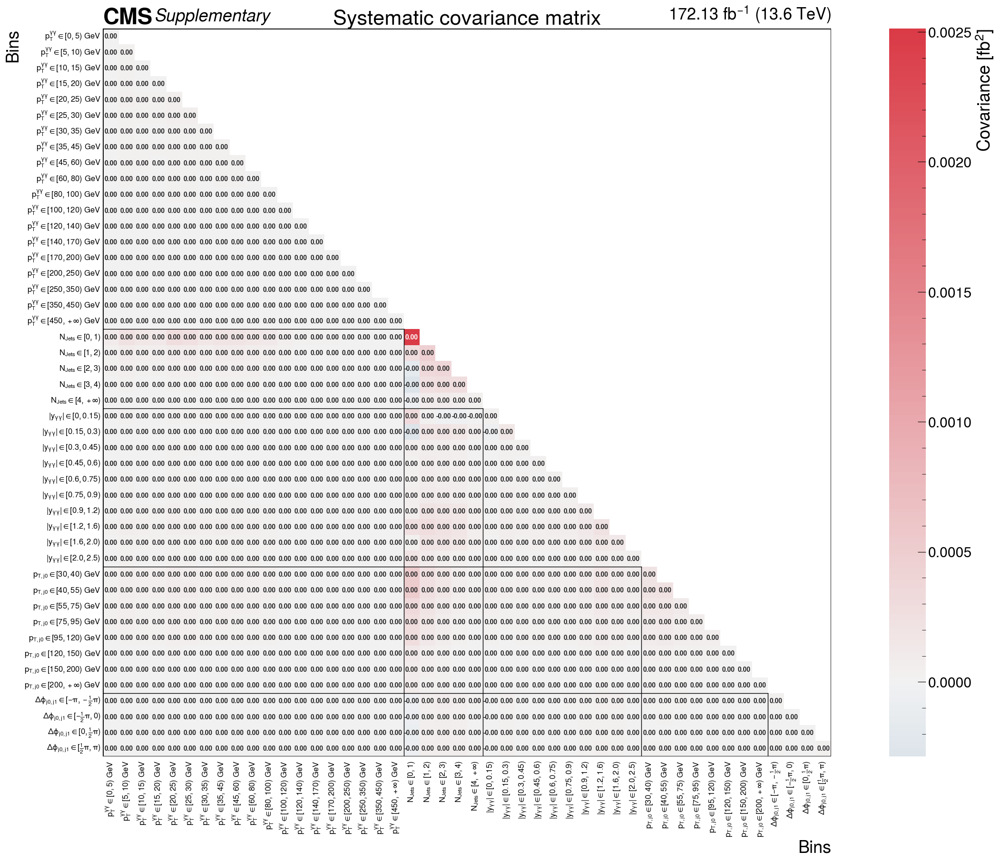

In [163]:
plot_cov(cov_syst, title="Systematic covariance matrix", save_path="covariance_matrix_systematic_combined.pdf", label_map=label_map, n_b4=b4-1)

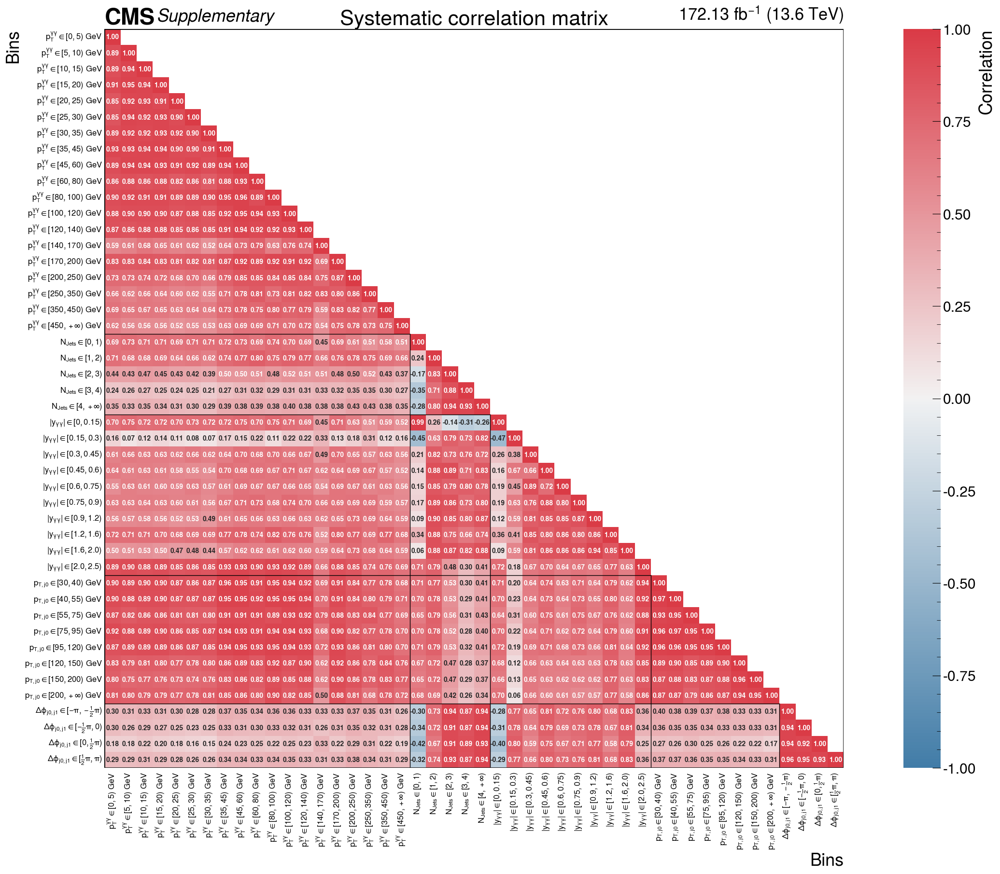

In [164]:
plot_corr(corr_from_cov(cov_syst), title="Systematic correlation matrix", save_path="correlation_matrix_systematic_combined.pdf", label_map=label_map, n_b4=b4-1)

#### Theory covariance matrix

In [165]:
# first, load the variances for alpha s and PDF as discussed with AT

FILE_RE = re.compile(
    r"^fidXS_(?P<obs>NJ|PTH|PTJ0|YH|DPhiJ0J1)_all\.py$"
)

def load_python_module(path: Path):
    spec = importlib.util.spec_from_file_location(path.stem, path)
    if spec is None or spec.loader is None:
        raise RuntimeError(f"Cannot load file: {path}")
    module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(module)
    return module

var = {
    "alpha": {
        "PTH": [],
        "NJ": [],
        "PTJ0": [],
        "YH": [],
        "DPhiJ0J1": [],
    },
    "pdf": {
        "PTH": [],
        "NJ": [],
        "PTJ0": [],
        "YH": [],
        "DPhiJ0J1": [],
    }
}

fidXS_folder = Path("fidXS")

for path in fidXS_folder.iterdir():
    match = FILE_RE.match(path.name)
    if not match:
        continue

    obs = match.group("obs")

    module = load_python_module(path)

    if not hasattr(module, "fidXS"):
        print(f"Skipping {path.name}: no fidXS vector")
        continue    

    fid_xs_nom = np.array(list(module.fidXS))  # convert once to numpy
    fid_xs_pdf_up = np.array(list(module.fidXS_pdf_up))
    fid_xs_alpha_up = np.array(list(module.fidXS_alpha_up))

    fid_xs_pdf_dn = np.array(list(module.fidXS_pdf_dn))
    fid_xs_alpha_dn = np.array(list(module.fidXS_alpha_dn))
  
    for i, nom_xs in enumerate(fid_xs_nom):
        if ((obs == "PTJ0") or (obs == "DPhiJ0J1")) and (i == 0):
            # Get rid of the underflow bins
            continue
        var["alpha"][obs].append(fid_xs_alpha_up[i] - fid_xs_nom[i])
        var["pdf"][obs].append(fid_xs_pdf_up[i] - fid_xs_nom[i])

In [166]:
# We fully correlate the Alpha S and PDF uncertainties

# Build the correlation matrix
n_bins = len(var["alpha"]["PTH"]) + len(var["alpha"]["NJ"]) + len(var["alpha"]["PTJ0"]) + len(var["alpha"]["YH"]) + len(var["alpha"]["DPhiJ0J1"])
matrix = np.ones((n_bins, n_bins), dtype=int)

# Use the dictionary values (or keys) as labels
labels = list(label_map.values())

# Drop underflow bins
labels.remove("r_PTJ0_m10000p0_30p0")
labels.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")

correlation = pd.DataFrame(
    matrix,
    index=labels,
    columns=labels
)


In [167]:
# Build the global ordered list of bins
all_bins = []
for obs in pois:
    all_bins.extend(pois[obs])

all_bins.remove("r_PTJ0_m10000p0_30p0")
all_bins.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")

# Replace the nested dicts with column-vector DataFrames
for source in var:

    values = []

    for obs in pois:
        values.extend(var[source][obs])

    var[source] = pd.DataFrame(
        values,
        index=all_bins,
        columns=[source]
    )

In [168]:
# Now compute the covariance per source

v_pdf = var["pdf"].iloc[:, 0]
Cov_pdf = correlation.mul(v_pdf, axis=0).mul(v_pdf, axis=1)

v_alpha = var["alpha"].iloc[:, 0]
Cov_alpha = correlation.mul(v_alpha, axis=0).mul(v_alpha, axis=1)

In [177]:
FILE_RE = re.compile(
    r"^fidXS_(?P<obs>PTH|NJ|PTJ0|YH|DPhiJ0J1)_all_scale(?P<scale>0|1|3|5|7|8)\.py$"
)

def load_python_module(path: Path):
    spec = importlib.util.spec_from_file_location(path.stem, path)
    if spec is None or spec.loader is None:
        raise RuntimeError(f"Cannot load file: {path}")
    module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(module)
    return module

scale_variations = {
    "0": {
        "PTH": [],
        "NJ": [],
        "PTJ0": [],
        "YH": [],
        "DPhiJ0J1": []
    },
    "1": {
        "PTH": [],
        "NJ": [],
        "PTJ0": [],
        "YH": [],
        "DPhiJ0J1": []
    },
    "3": {
        "PTH": [],
        "NJ": [],
        "PTJ0": [],
        "YH": [],
        "DPhiJ0J1": []
    },
    "5": {
        "PTH": [],
        "NJ": [],
        "PTJ0": [],
        "YH": [],
        "DPhiJ0J1": []
    },
    "7": {
        "PTH": [],
        "NJ": [],
        "PTJ0": [],
        "YH": [],
        "DPhiJ0J1": []
    },
    "8": {
        "PTH": [],
        "NJ": [],
        "PTJ0": [],
        "YH": [],
        "DPhiJ0J1": []
    }
}

scale_sigmas = scale_variations

# FILE_RE = re.compile(
#     r"^fidXS_(?P<obs>PTH|NJ|PTJ0|YH|DPhiJ0J1)_all_scale(?P<scale>08|17|35)\.py$"
# )

# def load_python_module(path: Path):
#     spec = importlib.util.spec_from_file_location(path.stem, path)
#     if spec is None or spec.loader is None:
#         raise RuntimeError(f"Cannot load file: {path}")
#     module = importlib.util.module_from_spec(spec)
#     spec.loader.exec_module(module)
#     return module

# scale_variations = {
#     "08": {
#         "PTH": [],
#         "NJ": [],
#         "PTJ0": [],
#         "YH": [],
#         "DPhiJ0J1": []
#     },
#     "17": {
#         "PTH": [],
#         "NJ": [],
#         "PTJ0": [],
#         "YH": [],
#         "DPhiJ0J1": []
#     },
#     "35": {
#         "PTH": [],
#         "NJ": [],
#         "PTJ0": [],
#         "YH": [],
#         "DPhiJ0J1": []
#     },
# }

fidXS_folder = Path("fidXS")

for path in fidXS_folder.iterdir():
    match = FILE_RE.match(path.name)
    if not match:
        continue

    obs = match.group("obs")
    scale = match.group("scale")

    module = load_python_module(path)

    if not hasattr(module, "fidXS"):
        print(f"Skipping {path.name}: no fidXS vector")
        continue

    sigma = np.array(list(module.fidXS))  # convert once to numpy
    up = np.array(list(module.fidXS_scale_up))
    dn = np.array(list(module.fidXS_scale_dn))
    
    if ((obs == "PTJ0") or (obs == "DPhiJ0J1")):
        sigma = sigma[1:]
        up = up[1:]
        dn = dn[1:]
    
    scale_variations[scale][obs] = up - sigma
    scale_sigmas[scale][obs] = up
    # scale_variations[scale][obs] = 0.5*(up - dn)
    

In [178]:
# Now compute the scale means

scale_means = {
    "PTH": [],
    "NJ": [],
    "PTJ0": [],
    "YH": [],
    "DPhiJ0J1": []
}

for obs in scale_means.keys():
    current_obs_list = []
    for i, scale in enumerate(scale_variations.keys()):
        current_obs_list.append(scale_sigmas[scale][obs])
    arrays = [np.array(x) for x in current_obs_list]
    scale_means[obs] =  [np.mean(k) for k in zip(*arrays)]


In [179]:
### Klijnsma Formula

observables = ["PTH", "NJ", "PTJ0", "YH", "DPhiJ0J1"]
bin_info = {
    "PTH": 19,
    "NJ": 5,
    "PTJ0": 9,
    "YH": 10,
    "DPhiJ0J1": 5,
}

# -----------------------------
# Build DataFrame (your setup)
# -----------------------------
cols = []
for obs in observables:
    for b in range(bin_info[obs]):
        if (b == 0) and ((obs == 'PTJ0') or (obs == 'DPhiJ0J1')):
            continue
        cols.append(f"{obs}_bin{b}")

print(cols)

data = []

for i in scale_sigmas:
    row = []
    for obs in observables:
        for b in range(bin_info[obs]):
            if (b == 0) and ((obs == 'PTJ0') or (obs == 'DPhiJ0J1')):
                continue
            b -= 1
            row.append(scale_sigmas[i][obs][b] - scale_means[obs][b])
    data.append(row)

df = pd.DataFrame(data, columns=cols)

# -----------------------------
# Cosine similarity matrix (UNCHANGED, uncentered)
# -----------------------------
bins = df.columns
n_bins = len(bins)
 
corr = pd.DataFrame(
    np.zeros((n_bins, n_bins)),
    index=bins,
    columns=bins
)

for a in bins:
    xa = df[a].to_numpy()

    denom_a = np.sum(xa ** 2)

    for b in bins:
        xb = df[b].to_numpy()

        denom_b = np.sum(xb ** 2)
        num = np.sum(xa * xb)

        corr.loc[a, b] = num / np.sqrt(denom_a * denom_b)


# Now compute the scale uncertainties from the fidXS output

FILE_RE = re.compile(
    r"^fidXS_(?P<obs>PTH|NJ|PTJ0|YH|DPhiJ0J1)_all\.py$"
)

def load_python_module(path: Path):
    spec = importlib.util.spec_from_file_location(path.stem, path)
    if spec is None or spec.loader is None:
        raise RuntimeError(f"Cannot load file: {path}")
    module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(module)
    return module

scale_uncertainties = {
    "PTH": [],
    "NJ": [],
    "PTJ0": [],
    "YH": [],
    "DPhiJ0J1": [],
}

fidXS_folder = Path("fidXS")

for path in fidXS_folder.iterdir():
    match = FILE_RE.match(path.name)
    if not match:
        continue

    obs = match.group("obs")
    module = load_python_module(path)

    if not hasattr(module, "fidXS"):
        print(f"Skipping {path.name}: no fidXS vector")
        continue

    sigma = np.array(list(module.fidXS))  # convert once to numpy
    up = np.array(list(module.fidXS_scale_up))
    
    if ((obs == "PTJ0") or (obs == "DPhiJ0J1")):
        sigma = sigma[1:]
        up = up[1:]
        dn = dn[1:]
    
    scale_uncertainties[obs] = up - sigma

unc = []

for obs in observables:
    unc.extend(scale_uncertainties[obs])  # your dict

sigma_THU = np.array(unc)


Cov_scale = corr * np.outer(sigma_THU, sigma_THU)

Cov_scale = pd.DataFrame(
    Cov_scale
)

Cov_scale = Cov_scale.rename(index=label_map_theory, columns=label_map_theory)

['PTH_bin0', 'PTH_bin1', 'PTH_bin2', 'PTH_bin3', 'PTH_bin4', 'PTH_bin5', 'PTH_bin6', 'PTH_bin7', 'PTH_bin8', 'PTH_bin9', 'PTH_bin10', 'PTH_bin11', 'PTH_bin12', 'PTH_bin13', 'PTH_bin14', 'PTH_bin15', 'PTH_bin16', 'PTH_bin17', 'PTH_bin18', 'NJ_bin0', 'NJ_bin1', 'NJ_bin2', 'NJ_bin3', 'NJ_bin4', 'PTJ0_bin1', 'PTJ0_bin2', 'PTJ0_bin3', 'PTJ0_bin4', 'PTJ0_bin5', 'PTJ0_bin6', 'PTJ0_bin7', 'PTJ0_bin8', 'YH_bin0', 'YH_bin1', 'YH_bin2', 'YH_bin3', 'YH_bin4', 'YH_bin5', 'YH_bin6', 'YH_bin7', 'YH_bin8', 'YH_bin9', 'DPhiJ0J1_bin1', 'DPhiJ0J1_bin2', 'DPhiJ0J1_bin3', 'DPhiJ0J1_bin4']


In [ ]:
# # Jonathons suggestion

# n_bins = len(scale_variations["08"]["PTH"]) + len(scale_variations["08"]["NJ"]) + len(scale_variations["08"]["PTJ0"]) + len(scale_variations["08"]["YH"]) + len(scale_variations["08"]["DPhiJ0J1"])
# matrix = np.ones((n_bins, n_bins), dtype=int)

# # Use the dictionary values (or keys) as labels
# labels = list(label_map.values())

# # Drop underflow bins
# labels.remove("r_PTJ0_m10000p0_30p0")
# labels.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")

# correlation = pd.DataFrame(
#     matrix,
#     index=labels,
#     columns=labels
# )

# # Build the global ordered list of bins
# all_bins = []
# for obs in pois:
#     all_bins.extend(pois[obs])
    
# all_bins.remove("r_PTJ0_m10000p0_30p0")

# # Replace the nested dicts with column-vector DataFrames
# for source in scale_variations:

#     values = []

#     for obs in pois:
#         values.extend(scale_variations[source][obs])

#     scale_variations[source] = pd.DataFrame(
#         values,
#         index=all_bins,
#         columns=[source]
#     )
    
# v_08 = scale_variations["08"].iloc[:, 0]
# Cov_08 = correlation.mul(v_08, axis=0).mul(v_08, axis=1)

# v_17 = scale_variations["17"].iloc[:, 0]
# Cov_17 = correlation.mul(v_17, axis=0).mul(v_17, axis=1)

# v_35 = scale_variations["35"].iloc[:, 0]
# Cov_35 = correlation.mul(v_35, axis=0).mul(v_35, axis=1)

# Cov_scale = Cov_08 + Cov_17 + Cov_35 

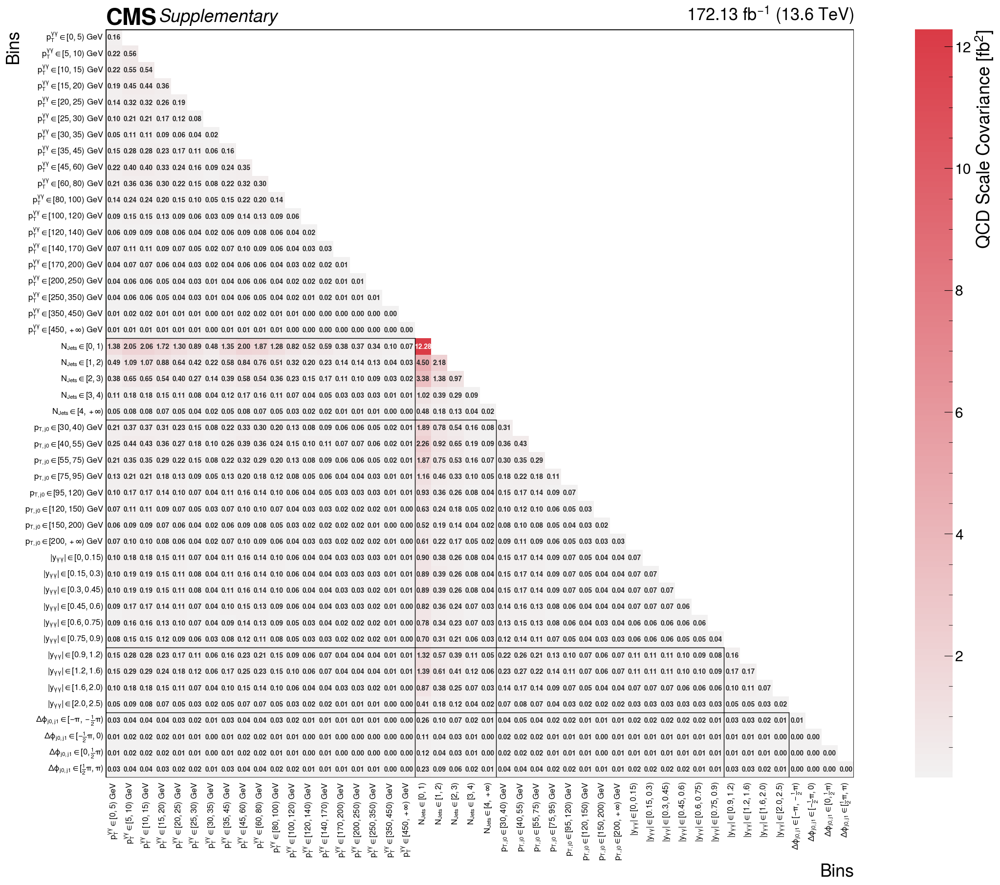

In [180]:
plot_cov(Cov_scale, title="", save_path="covariance_matrix_scale_klijnsma_combined.pdf", plot_label=r"QCD Scale Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3+4, n_b4=b4-1)

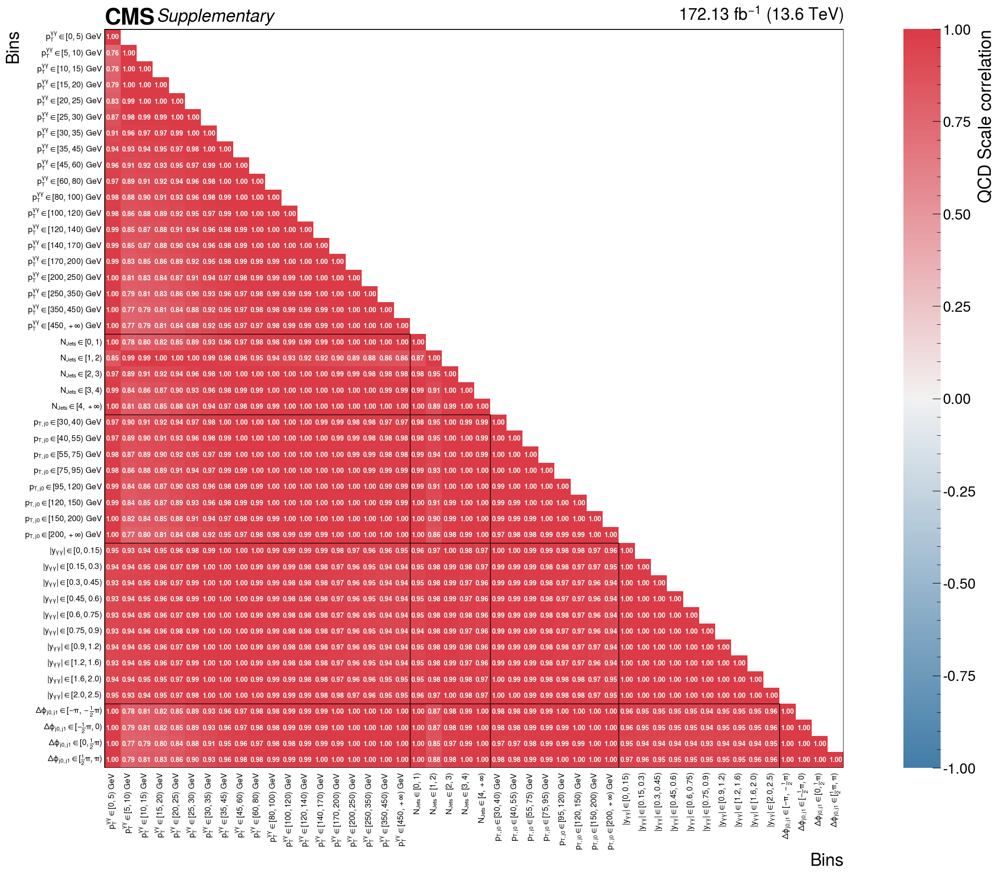

In [181]:
plot_corr(corr_from_cov(Cov_scale), title="", save_path="correlation_matrix_scale_klijnsma_combined.pdf", plot_label="QCD Scale correlation", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-1)

In [182]:
Cov_Theor = Cov_pdf + Cov_alpha + Cov_scale

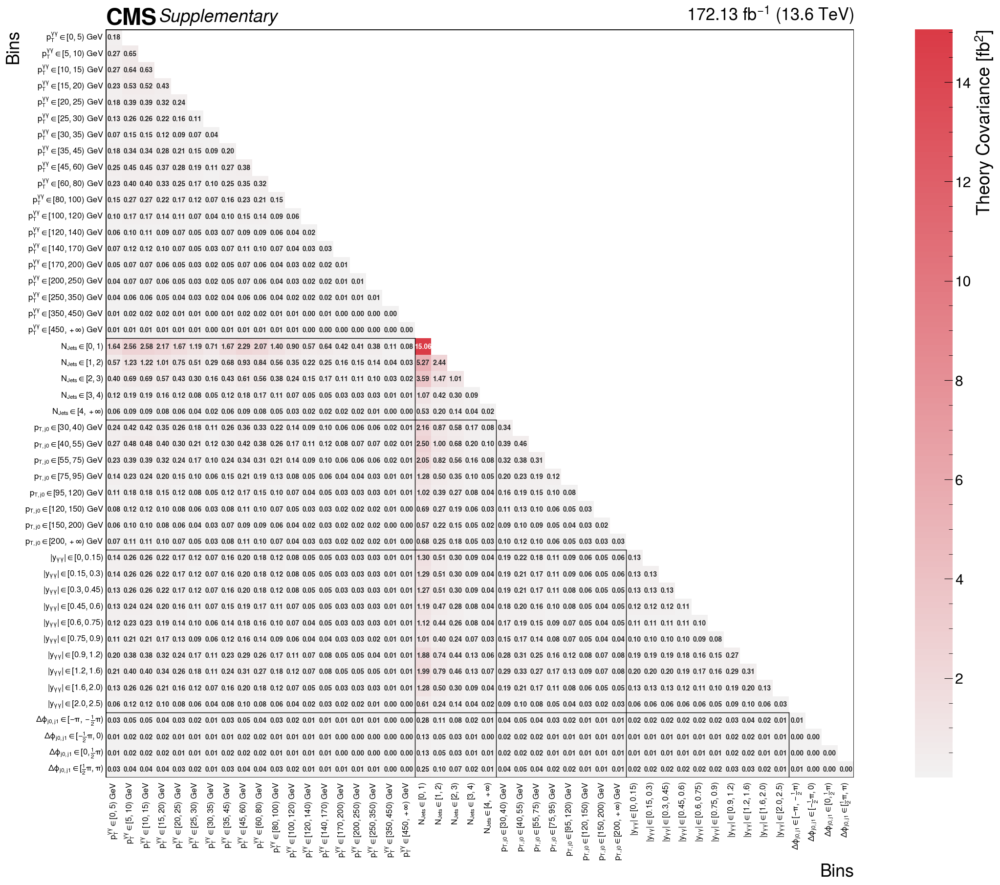

In [183]:
plot_cov(Cov_Theor, title="", save_path="covariance_matrix_theory_combined.pdf", plot_label=r"Theory Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-1)

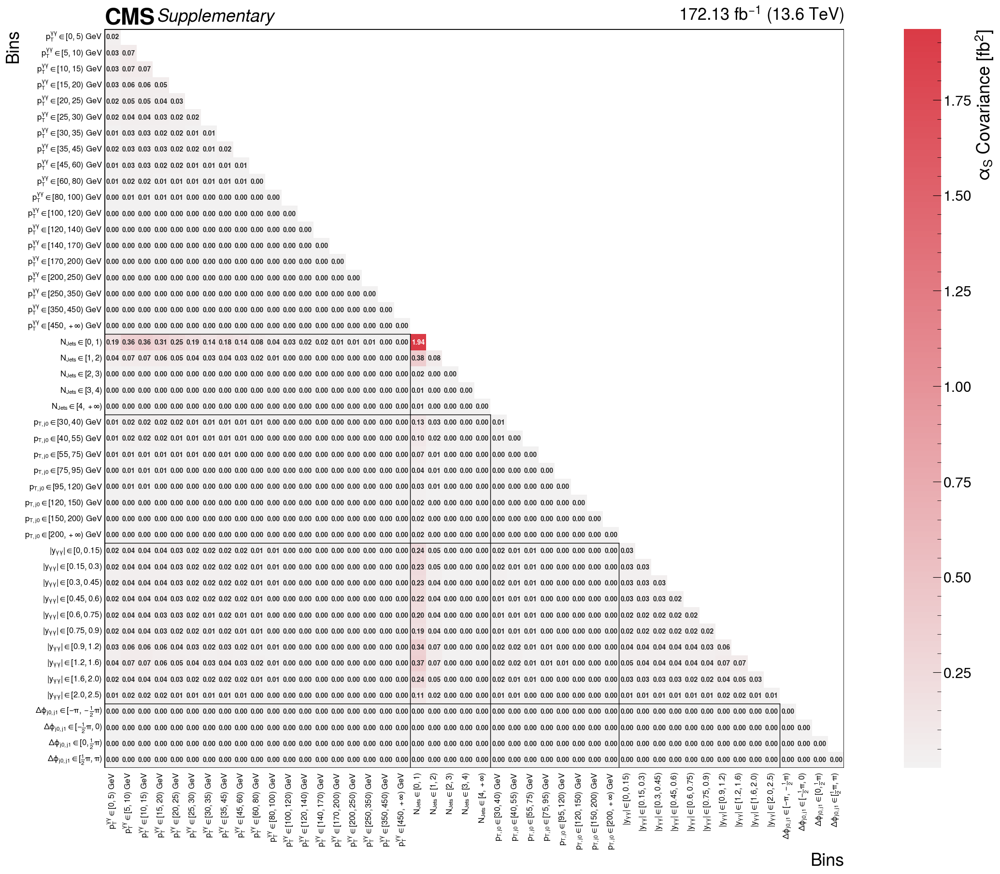

In [184]:
plot_cov(Cov_alpha, title="", save_path="covariance_matrix_alpha_combined.pdf", plot_label=r"$\alpha_{S}$ Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-1)


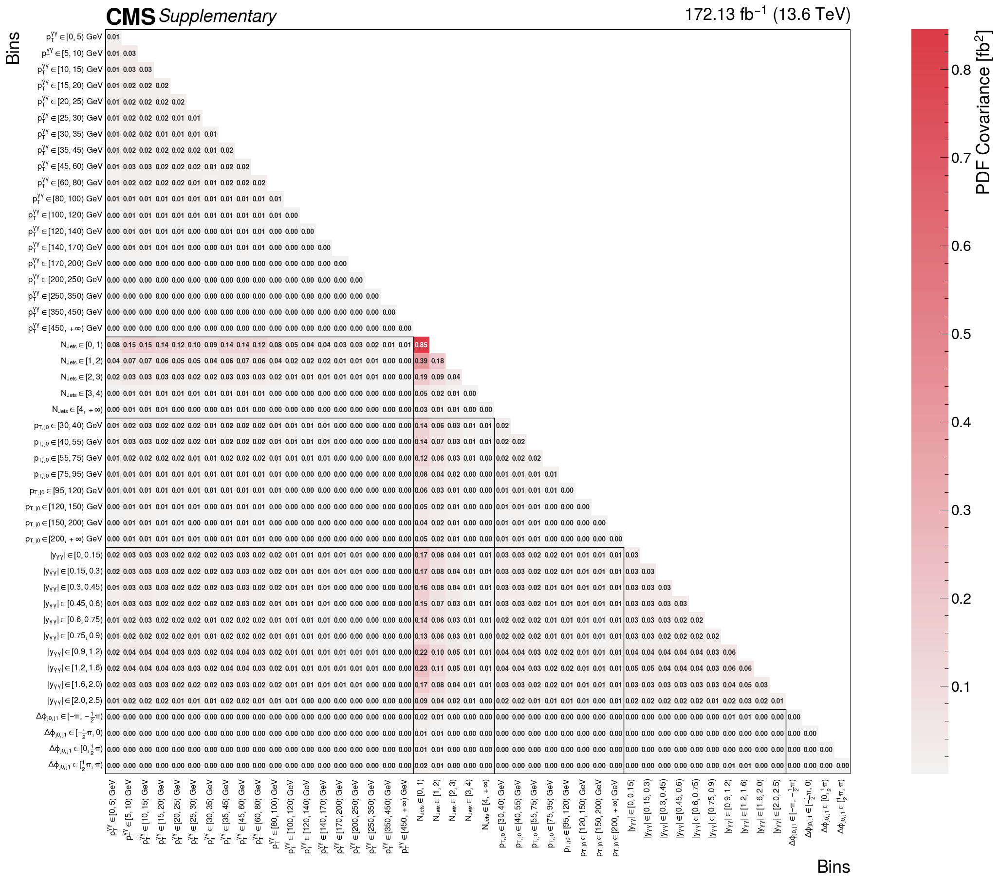

In [185]:
plot_cov(Cov_pdf, title="", save_path="covariance_matrix_pdf_combined.pdf", plot_label=r"PDF Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-1)

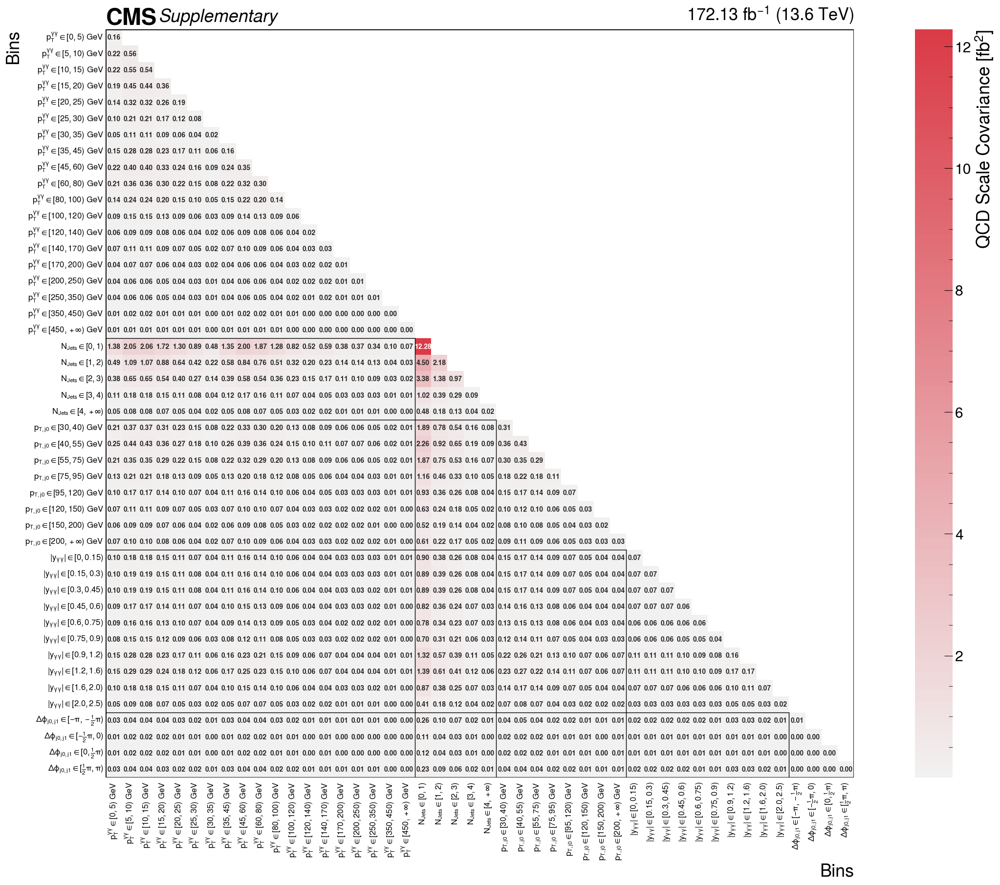

In [186]:
plot_cov(Cov_scale, title="", save_path="covariance_matrix_scale_combined.pdf", plot_label=r"QCD Scale Covariance [fb$^{2}$]", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-1)

In [187]:
cov_syst = cov_syst.rename(index=label_map, columns=label_map)
cov_stat = cov_stat.rename(index=label_map, columns=label_map)

# Drop underflow bins
label_maps_noUnderflow = list(label_map.values())
label_maps_noUnderflow.remove("r_PTJ0_m10000p0_30p0")
label_maps_noUnderflow.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")

cov_syst = cov_syst.loc[label_maps_noUnderflow, label_maps_noUnderflow]
cov_stat = cov_stat.loc[label_maps_noUnderflow, label_maps_noUnderflow]

In [188]:
cov_tot = cov_stat + cov_syst + Cov_Theor
corr_tot = corr_from_cov(cov_tot)

In [189]:
cov_tot = cov_tot.rename(index=label_map, columns=label_map)

In [190]:
corr_tot = corr_tot.loc[label_maps_noUnderflow, label_maps_noUnderflow]
cov_tot = cov_tot.loc[label_maps_noUnderflow, label_maps_noUnderflow]

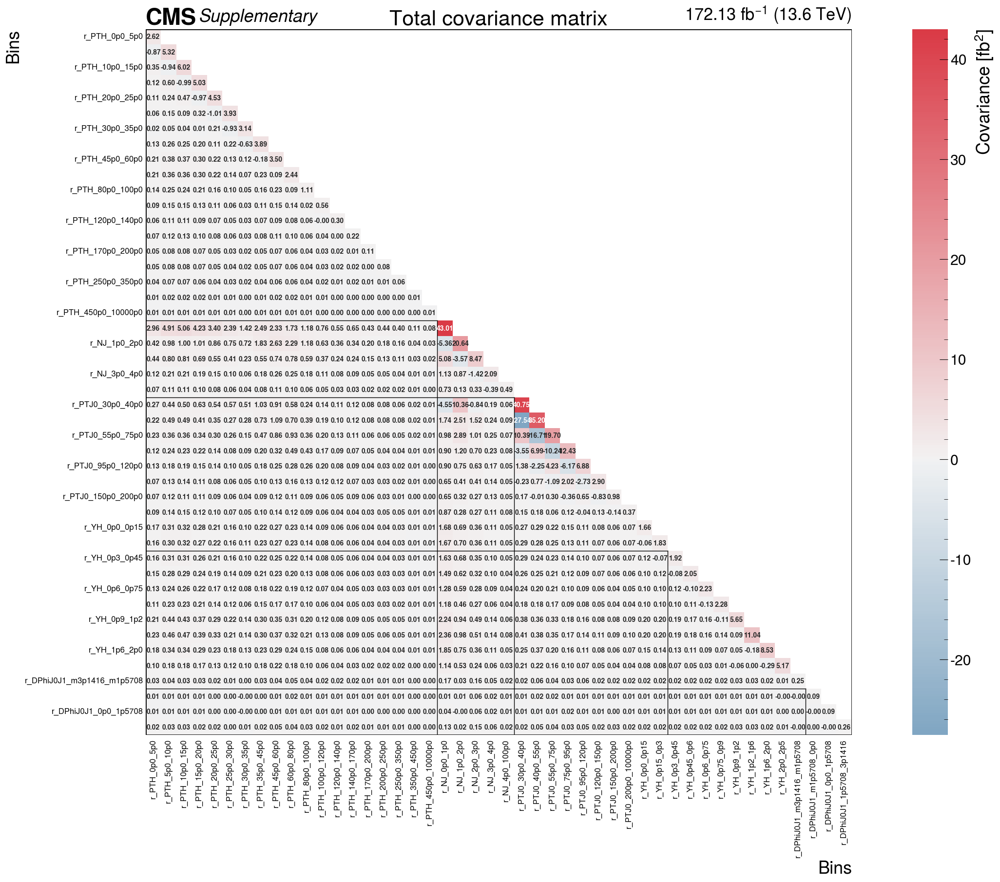

In [191]:
plot_cov(cov_tot, title="Total covariance matrix", save_path="covariance_matrix_total_combined.pdf")

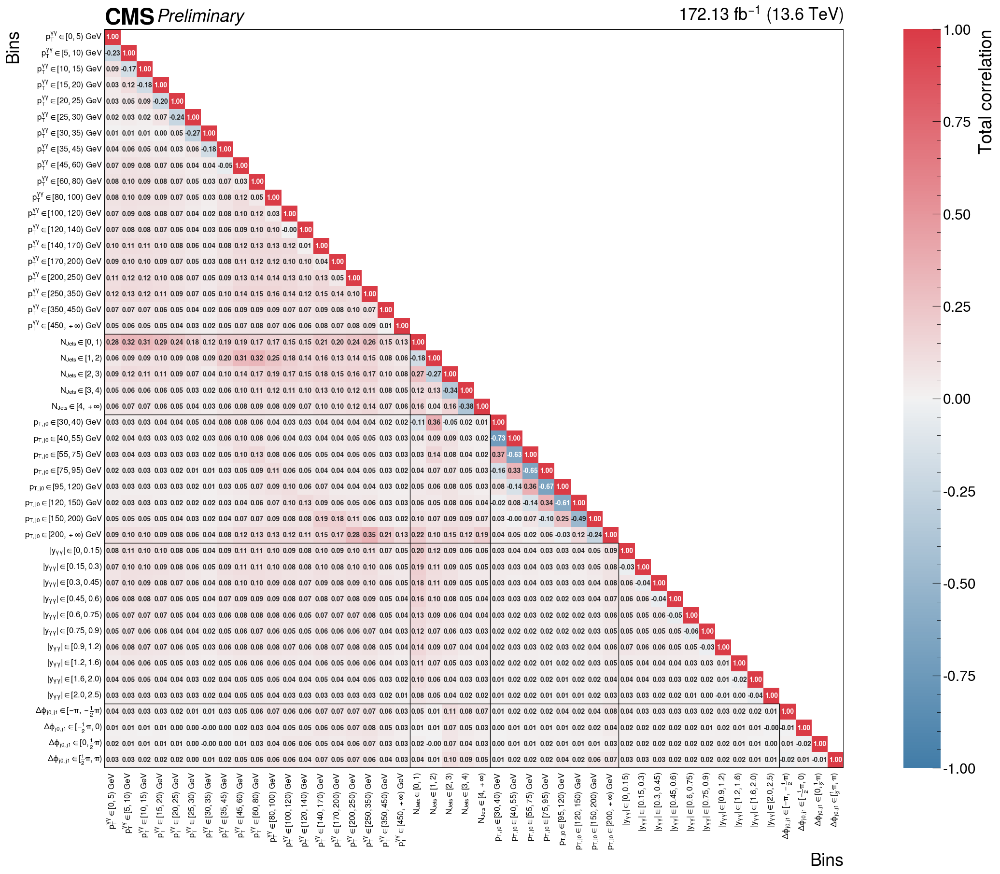

In [192]:
plot_corr(corr_tot, title="", save_path="correlation_matrix_total_combined.pdf", cms_label="Preliminary", plot_label="Total correlation", apply_translation=True, label_map=label_map, n_b3=b3-2, n_b4=b4-1)

#### Saving information in Nico-friendly format

In [ ]:
## Save matrices in a Nico-friendly format
import yaml

def dataframe_to_yaml_rows(
    df,
    output_yaml,
    label_map,
    target_order=None,
    zero_tol=0.0,
):
    """
    Convert square DataFrame -> YAML list-of-row-dicts format.

    - df: pandas DataFrame (square)
    - output_yaml: output path
    - label_map: dict old_label -> new_label
    - target_order: list of NEW labels in desired final order.
                    If None, uses DataFrame order after renaming.
    - zero_tol: values with abs(x) < zero_tol are written as 0.0
    """
    if not isinstance(df, pd.DataFrame):
        raise TypeError("df must be a pandas DataFrame")
    if df.shape[0] != df.shape[1]:
        raise ValueError("df must be square")

    # Rename both axes
    m = df.rename(index=label_map, columns=label_map).copy()

    # If desired order not provided, keep current renamed order
    if target_order is None:
        target_order = list(m.index)

    # Validate target labels exist
    missing_rows = [x for x in target_order if x not in m.index]
    missing_cols = [x for x in target_order if x not in m.columns]
    if missing_rows or missing_cols:
        raise KeyError(
            f"Missing labels after renaming.\n"
            f"Rows missing: {missing_rows}\n"
            f"Cols missing: {missing_cols}"
        )

    # Reorder matrix
    m = m.loc[target_order, target_order].astype(float)

    # Build YAML structure: list of dicts (one row per item)
    rows = []
    for _, row in m.iterrows():
        d = {}
        for col, val in row.items():
            x = float(val)
            if abs(x) < zero_tol:
                x = 0.0
            d[col] = x
        rows.append(d)

    with open(output_yaml, "w") as f:
        yaml.safe_dump(rows, f, sort_keys=False, default_flow_style=False)

def extract_diag_sqrt(Cov_Theor):
    """
    Extract the diagonal elements of a pandas DataFrame
    and return their square roots in a dictionary.

    Parameters
    ----------
    Cov_Theor : pandas.DataFrame
        Square covariance matrix.

    Returns
    -------
    dict
        Dictionary with column/index names as keys and
        sqrt(diagonal element) as values.
    """
    diag_values = np.diag(Cov_Theor.values)
    
    return {
        name: np.sqrt(value)
        for name, value in zip(Cov_Theor.index, diag_values)
    }

In [ ]:
target_order = pois["PTH"] + pois["NJ"] + pois["PTJ0"] + pois["YH"] + pois["DPhiJ0J1"]

In [ ]:
target_order.remove("r_PTJ0_m10000p0_30p0")
target_order.remove("r_DPhiJ0J1_m3p1416_3p1416_underflow")

In [ ]:
dataframe_to_yaml_rows(
    df=corr_tot, 
    output_yaml="corr_tot.yaml",
    label_map=label_map,
    target_order=target_order,
    zero_tol=1e-12, ## zero_tol is the threshold below which numbers are forced to 0.0 when exporting
)

In [ ]:
dataframe_to_yaml_rows(
    df=Cov_Theor, 
    output_yaml="cov_theory.yaml",
    label_map=label_map,
    target_order=target_order,
    zero_tol=1e-12, ## zero_tol is the threshold below which numbers are forced to 0.0 when exporting
)

In [ ]:
extract_diag_sqrt(Cov_Theor)

{'r_PTH_0p0_5p0': 0.42438122881815304,
 'r_PTH_5p0_10p0': 0.8076970717507115,
 'r_PTH_10p0_15p0': 0.7946793751829242,
 'r_PTH_15p0_20p0': 0.6572023636197347,
 'r_PTH_20p0_25p0': 0.4892021096810138,
 'r_PTH_25p0_30p0': 0.33594488606221046,
 'r_PTH_30p0_35p0': 0.20307989118587963,
 'r_PTH_35p0_45p0': 0.44900491824387634,
 'r_PTH_45p0_60p0': 0.6168400139783011,
 'r_PTH_60p0_80p0': 0.5631798969419988,
 'r_PTH_80p0_100p0': 0.3811706728180769,
 'r_PTH_100p0_120p0': 0.24376637409975047,
 'r_PTH_120p0_140p0': 0.15533203894447667,
 'r_PTH_140p0_170p0': 0.17485510724175593,
 'r_PTH_170p0_200p0': 0.11225189430789168,
 'r_PTH_200p0_250p0': 0.10989812910205278,
 'r_PTH_250p0_350p0': 0.1014527913301051,
 'r_PTH_350p0_450p0': 0.03024735480824003,
 'r_PTH_450p0_10000p0': 0.021259812444434034,
 'r_NJ_0p0_1p0': 3.880860726008241,
 'r_NJ_1p0_2p0': 1.5607224370099548,
 'r_NJ_2p0_3p0': 1.004850073972498,
 'r_NJ_3p0_4p0': 0.29735331303645357,
 'r_NJ_4p0_100p0': 0.14261595161697135,
 'r_PTJ0_30p0_40p0': 0.58

In [ ]:
# For PCA

dataframe_to_yaml_rows(
    df=cov_tot, 
    output_yaml="cov_tot_PTH_NJ_PTJ0_rapidity_DPhiJ0J1.yaml",
    label_map=label_map,
    target_order=target_order,
    zero_tol=1e-12, ## zero_tol is the threshold below which numbers are forced to 0.0 when exporting
)

In [100]:
fidXS_PTH = [3.251514094855517, 6.413825763609831, 6.555809968521467, 5.889800810939074, 5.099083112515962, 4.421885114513488, 3.866226543790849, 6.441680337807897, 6.902988952146682, 5.9025422289283505, 3.8146832368240626, 2.5035992765212907, 1.728313772250199, 1.7476552427460155, 1.0831025476943583, 1.0182794676925542, 0.8199434493201138, 0.25644320024731754, 0.16456440773573974]
fidXS_NJ = [36.46013279924294, 19.39595337442149, 8.780897688557815, 2.1285339711776765, 1.117648241828872]
fidXS_PTJ0 = [36.46013279924294, 6.663873021305533, 7.050146523728949, 5.894645706317997, 3.654783295750552, 2.8293975792219843, 1.990389506704825, 1.6537018867095121, 38.14622855548648]
fidXS_YH = [6.571010820445315, 6.4878499407752805, 6.374530083157725, 6.159720064093899, 5.79610179997262, 5.471530119936904, 9.913956621106973, 10.81253639411838, 7.0842765398757725, 3.211653691747486]
fidXS_DPhiJ0J1 = [65.21952099254116, 0.8106934454948248, 0.5284340993292949, 0.5398399759381666, 0.7845488948952335]


uncMu_total_PTH = [0.481, 0.339, 0.355, 0.365, 0.410, 0.446, 0.457, 0.300, 0.258, 0.249, 0.260, 0.284, 0.305, 0.251, 0.287, 0.259, 0.259, 0.429, 0.582]
uncMu_stat_PTH = [0.480, 0.337, 0.354, 0.364, 0.406, 0.442, 0.455, 0.298, 0.256, 0.247, 0.258, 0.283, 0.304, 0.250, 0.285, 0.258, 0.258, 0.427, 0.580]
uncMu_syst_PTH = [np.sqrt(uncMu_total_PTH[i]**2 - uncMu_stat_PTH[i]**2) for i, _ in enumerate(uncMu_total_PTH)]

uncMu_total_NJ = [0.150, 0.223, 0.315, 0.672, 0.619]
uncMu_stat_NJ = [0.145, 0.220, 0.311, 0.665, 0.614]
uncMu_syst_NJ = [np.sqrt(uncMu_total_NJ[i]**2 - uncMu_stat_NJ[i]**2) for i, _ in enumerate(uncMu_total_NJ)]

uncMu_total_PTJ0 = [0.163, 0.958, 0.841, 0.751, 0.964, 0.927, 0.854, 0.594, 0.349]
uncMu_stat_PTJ0 = [0.155, 0.954, 0.836, 0.747, 0.960, 0.922, 0.851, 0.591, 0.346]
uncMu_syst_PTJ0 = [np.sqrt(uncMu_total_PTJ0[i]**2 - uncMu_stat_PTJ0[i]**2) for i, _ in enumerate(uncMu_total_PTJ0)]

uncMu_total_YH = [0.193, 0.203, 0.227, 0.229, 0.254, 0.277, 0.237, 0.306, 0.414, 0.694]
uncMu_stat_YH = [0.190, 0.203, 0.225, 0.226, 0.252, 0.275, 0.234, 0.306, 0.414, 0.692]
uncMu_syst_YH = [np.sqrt(uncMu_total_YH[i]**2 - uncMu_stat_YH[i]**2) for i, _ in enumerate(uncMu_total_YH)]

uncMu_total_DPhiJ0J1 = [0.088, 0.616, 0.571, 0.566, 0.646]
uncMu_stat_DPhiJ0J1 = [0.083, 0.610, 0.563, 0.557, 0.640]
uncMu_syst_DPhiJ0J1 = [np.sqrt(uncMu_total_DPhiJ0J1[i]**2 - uncMu_stat_DPhiJ0J1[i]**2) for i, _ in enumerate(uncMu_total_DPhiJ0J1)]



uncMu_stat = uncMu_stat_PTH + uncMu_stat_NJ + uncMu_stat_YH + uncMu_stat_PTJ0 + uncMu_stat_DPhiJ0J1
uncMu_syst = uncMu_syst_PTH + uncMu_syst_NJ + uncMu_syst_YH + uncMu_syst_PTJ0 + uncMu_syst_DPhiJ0J1


covMu_stat = cor_cholesky * np.outer(uncMu_stat, uncMu_stat)
covMu_syst = syst_matrix * np.outer(uncMu_syst, uncMu_syst)

covMu_stat = covMu_stat.rename(index=label_map, columns=label_map)
covMu_syst = covMu_syst.rename(index=label_map, columns=label_map)

In [101]:
fidXS = fidXS_PTH + fidXS_NJ + fidXS_PTJ0 + fidXS_YH + fidXS_DPhiJ0J1

In [860]:
sqrt_diag = np.sqrt(np.diag(Cov_Theor))

In [861]:
uncMu_theor = [unc_theor / fidXS[i] for i, unc_theor in enumerate(sqrt_diag)]

In [862]:
CovMu_Theor = corr_from_cov(Cov_Theor) * np.outer(uncMu_theor,uncMu_theor)

In [102]:
CovMu_tot = covMu_stat + covMu_syst# + CovMu_Theor 

In [103]:
CovMu_tot = CovMu_tot.rename(index=label_map, columns=label_map)
CovMu_tot = CovMu_tot.loc[list(label_map.values()), list(label_map.values())]

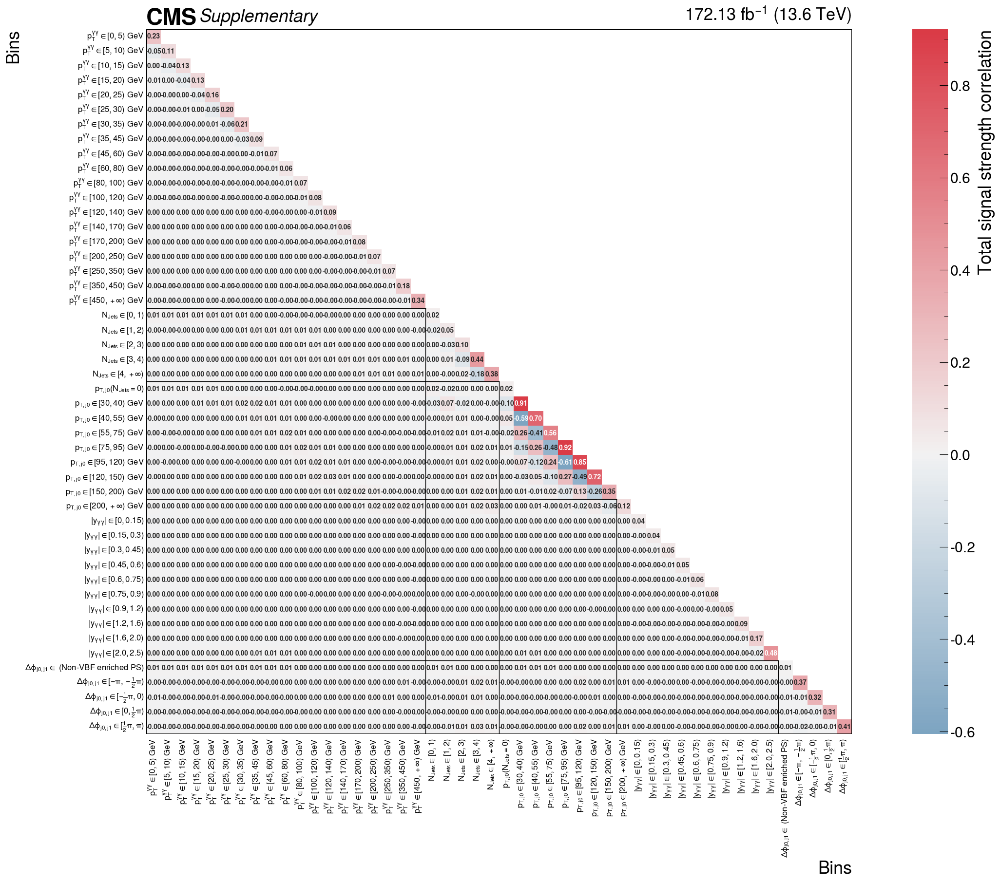

In [104]:
plot_cov(CovMu_tot, title=r"", save_path="covariance_matrix_total_mu_combined.pdf", plot_label="Total signal strength correlation", apply_translation=True, label_map=label_map, n_b3=b3-2)

In [ ]:
dataframe_to_yaml_rows(
    df=CovMu_tot, 
    output_yaml="cov_tot_PTH_NJ_PTJ0_rapidity_DPhiJ0J1_mu_noTHU.yaml",
    label_map=label_map,
    target_order=target_order,
    zero_tol=1e-12, ## zero_tol is the threshold below which numbers are forced to 0.0 when exporting
)